## 1. Setup e Instalação de Dependências

In [1]:
DRIVE = True
if DRIVE:
  from google.colab import drive
  drive.mount('/content/drive')

  # Copie sua pasta 'Data Segmentation' do Google Drive para o diretório atual do Colab
  !cp -r "/content/drive/My Drive/Data Segmentation" "./Data Segmentation"

  # Verifique se a pasta foi copiada com sucesso listando seu conteúdo
  !ls -F "./Data Segmentation/train/images"

Mounted at /content/drive
pic-100-_jpg.rf.17047bb032a49c96643c5f2108bb99dd.jpg
pic-100-_jpg.rf.8c9076ee84698f90f04765f4e794a819.jpg
pic-100-_jpg.rf.ebc3af260e989e6f9e1e9221b9dff6b0.jpg
pic-101-_jpg.rf.1e32a49f89a38974ded11bba8dd3e56b.jpg
pic-101-_jpg.rf.4abe48a3d2a5e556908bf4286446e5ce.jpg
pic-101-_jpg.rf.8380b58f6540ec91db66934b342f7f9e.jpg
pic-102-_jpg.rf.bb6db5bdb59d1a6af15b0a0b565a3cdb.jpg
pic-102-_jpg.rf.cd0b0b3a64e3a11005884c98c1f6c3aa.jpg
pic-102-_jpg.rf.df35bf045672f19a05f84a8c365dab3a.jpg
pic-103-_jpg.rf.26017e20e92320bcde575710389353b1.jpg
pic-103-_jpg.rf.4fa35472ae606aca56d49966dc91b5b6.jpg
pic-103-_jpg.rf.e204fd0f4f80094ec52c54c31ab06db0.jpg
pic-104-_jpg.rf.117ec7cfcc77d6e6f80130934b1d5aa1.jpg
pic-104-_jpg.rf.e4efc52e048da0b6918c135b1bd39962.jpg
pic-104-_jpg.rf.f986cb78d75fc164de95ac33c56d9474.jpg
pic-105-_jpg.rf.0b52d3fe11f0b249a5eb2f14a8f0a14f.jpg
pic-105-_jpg.rf.0ce0939aec2bb2ab235addf64d130914.jpg
pic-105-_jpg.rf.859bee21c8abeda9bc4ef41da6d2d0bf.jpg
pic-106-_jpg.rf.0cbf

In [2]:
# Instalação das dependências
!pip install segment-anything torch torchvision opencv-python matplotlib numpy tqdm pandas
!pip install groundingdino-py supervision  # Para Grounded-SAM

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 25.3 MB/s eta 0:00:00
  Created wheel for groundingdino-py: filename=groundingdino_py-0.4.0-py2.py3-none-any.whl size=88737 sha256=2090b8aeaf5422fb52094be07725fa08875ab3415a3e58316bb544a211917050
  Stored in directory: /root/.cache/pip/wheels/74/c4/d6/2c6ded61819d391715b4f1ae483f2cfdc8f2eeb6bbb63e748b
Successfully built groundingdino-py


In [3]:
# Imports principais
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import pandas as pd
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import BCEWithLogitsLoss
from segment_anything.utils.transforms import ResizeLongestSide
from tqdm import tqdm
import time
import warnings
warnings.filterwarnings('ignore')

# Configuração do device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🖥️  Usando device: {device}")
print(f"🔥 CUDA disponível: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"📊 GPU: {torch.cuda.get_device_name(0)}")

🖥️  Usando device: cuda
🔥 CUDA disponível: True
📊 GPU: NVIDIA A100-SXM4-40GB


## 2. Dataset e Utilitários

In [4]:
# Dataset personalizado
class StreetHoleDataset(Dataset):
    def __init__(self, images_dir, masks_dir):
        self.images_dir = images_dir
        self.masks_dir = masks_dir

        self.image_files = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.png'))]
        self.image_files.sort()

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.images_dir, img_name)
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask_name = img_name.rsplit('.', 1)[0] + '_mask.png'
        mask_path = os.path.join(self.masks_dir, mask_name)

        if os.path.exists(mask_path):
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask = (mask > 127).astype(np.uint8)
        else:
            mask = np.zeros(image.shape[:2], dtype=np.uint8)

        return {
            'image': image,
            'mask': mask,
            'filename': img_name
        }

# Criar datasets
train_dataset = StreetHoleDataset(
    images_dir='Data Segmentation/train/images',
    masks_dir='Data Segmentation/masks_train'
)

val_dataset = StreetHoleDataset(
    images_dir='Data Segmentation/valid/images',
    masks_dir='Data Segmentation/masks_valid'
)

print(f"📚 Dataset de treino: {len(train_dataset)} imagens")
print(f"📚 Dataset de validação: {len(val_dataset)} imagens")

📚 Dataset de treino: 720 imagens
📚 Dataset de validação: 60 imagens


In [5]:
# Funções de métricas
def calculate_iou(pred_mask, gt_mask):
    """Calcula Intersection over Union (IoU)"""
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    return intersection / union

def calculate_dice(pred_mask, gt_mask):
    """Calcula Dice Coefficient"""
    intersection = np.logical_and(pred_mask, gt_mask).sum()

    if pred_mask.sum() + gt_mask.sum() == 0:
        return 1.0

    return 2 * intersection / (pred_mask.sum() + gt_mask.sum())

def calculate_metrics(pred_mask, gt_mask):
    """Calcula todas as métricas"""
    return {
        'iou': calculate_iou(pred_mask, gt_mask),
        'dice': calculate_dice(pred_mask, gt_mask)
    }

def dice_loss(logits, target):
    """Dice Loss para treinamento"""
    p = torch.sigmoid(logits)
    inter = (p * target).sum()
    union = p.sum() + target.sum()
    return 1 - (2 * inter + 1e-6) / (union + 1e-6)

In [6]:
# Funções auxiliares para prompts
def get_bbox_from_mask(mask):
    """Extrai bounding box da máscara"""
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)

    if not rows.any() or not cols.any():
        return None

    rmin, rmax = np.where(rows)[0][[0, -1]]
    cmin, cmax = np.where(cols)[0][[0, -1]]

    return np.array([cmin, rmin, cmax, rmax])

def get_center_point_from_mask(mask):
    """Extrai ponto central da máscara"""
    rows, cols = np.where(mask > 0)

    if len(rows) == 0:
        return None

    center_y = int(np.mean(rows))
    center_x = int(np.mean(cols))

    return np.array([[center_x, center_y]])

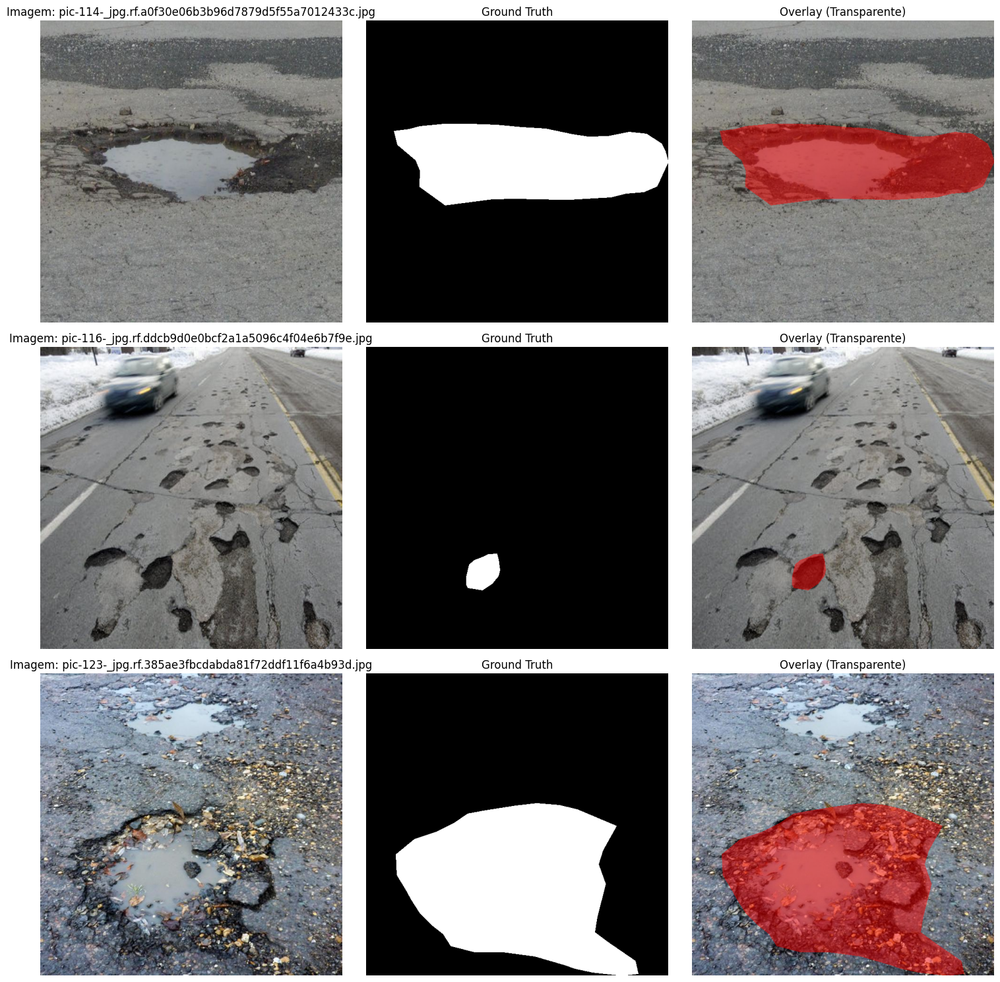

In [7]:
# Visualizar exemplos do dataset
def visualize_samples(dataset, num_samples=3):
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))

    for i in range(num_samples):
        sample = dataset[i]
        image = sample['image']
        mask = sample['mask']

        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f"Imagem: {sample['filename']}")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis('off')

        # Overlay com transparência
        overlay = image.copy()
        alpha = 0.5  # Fator de transparência

        # Onde a máscara é 1, misturamos o pixel original com vermelho
        mask_bool = mask == 1
        if mask_bool.any():
            # Blend: (1-alpha)*Imagem + alpha*Vermelho
            overlay[mask_bool] = (overlay[mask_bool] * (1 - alpha) + np.array([255, 0, 0]) * alpha).astype(np.uint8)

        axes[i, 2].imshow(overlay)
        axes[i, 2].set_title("Overlay (Transparente)")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

visualize_samples(val_dataset, num_samples=3)

## 3. Download dos Modelos SAM

In [8]:
import urllib.request
import shutil # Importar shutil para copiar arquivos

# URLs dos checkpoints
checkpoint_urls = {
    "vit_b": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth",
    "vit_l": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth",
    "vit_h": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth"
}

os.makedirs("checkpoints", exist_ok=True)

for model_type, url in checkpoint_urls.items():
    checkpoint_filename = os.path.basename(url)
    local_checkpoint_path = f"checkpoints/{checkpoint_filename}"
    drive_checkpoint_path = f"/content/drive/My Drive/Colab Models/checkpoints/{checkpoint_filename}"

    if not os.path.exists(local_checkpoint_path):
        if os.path.exists(drive_checkpoint_path):
            print(f"🔄 Copiando {model_type.upper()} do Google Drive para o ambiente local...")
            shutil.copy(drive_checkpoint_path, local_checkpoint_path)
            print(f"✅ {model_type.upper()} copiado do Drive!")
        else:
            print(f"⬇️  Baixando {model_type.upper()}...")
            urllib.request.urlretrieve(url, local_checkpoint_path)
            print(f"✅ {model_type.upper()} baixado!")
    else:
        print(f"✅ {model_type.upper()} já existe localmente!")

print("\n🎉 Todos os checkpoints prontos!")

🔄 Copiando VIT_B do Google Drive para o ambiente local...
✅ VIT_B copiado do Drive!
🔄 Copiando VIT_L do Google Drive para o ambiente local...
✅ VIT_L copiado do Drive!
🔄 Copiando VIT_H do Google Drive para o ambiente local...
✅ VIT_H copiado do Drive!

🎉 Todos os checkpoints prontos!


## 4. Comparação entre Modelos SAM (ViT-B vs ViT-L vs ViT-H)

Vamos comparar os três tamanhos de modelo SAM em termos de:
- **Qualidade da segmentação** (IoU e Dice)
- **Tempo de inferência**
- **Qualidade visual**

In [9]:
def evaluate_model_comparison(models_dict, dataset, num_samples=20):
    """
    Compara diferentes modelos SAM
    """
    results = {}

    for model_name, model in models_dict.items():
        print(f"\n🔍 Avaliando {model_name}...")
        predictor = SamPredictor(model)

        metrics_list = []
        times = []

        for i in tqdm(range(min(num_samples, len(dataset)))):
            sample = dataset[i]
            image = sample['image']
            gt_mask = sample['mask']

            predictor.set_image(image)

            bbox = get_bbox_from_mask(gt_mask)
            if bbox is None:
                continue

            start_time = time.time()
            masks, scores, logits = predictor.predict(
                box=bbox,
                multimask_output=False
            )
            elapsed = time.time() - start_time

            pred_mask = masks[0]
            metrics = calculate_metrics(pred_mask, gt_mask)

            metrics_list.append(metrics)
            times.append(elapsed)

        avg_metrics = {
            'iou': np.mean([m['iou'] for m in metrics_list]),
            'dice': np.mean([m['dice'] for m in metrics_list]),
            'time': np.mean(times)
        }

        results[model_name] = avg_metrics
        print(f"  IoU: {avg_metrics['iou']:.4f} | Dice: {avg_metrics['dice']:.4f} | Tempo: {avg_metrics['time']:.4f}s")

    return results

In [12]:
# Carregar os três modelos
import os
import urllib.request

print("🔄 Carregando modelos SAM...")

checkpoint_urls = {
    "vit_b": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth",
    "vit_l": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth",
    "vit_h": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth"
}

def load_model_safe(model_type, checkpoint_path, device):
    # Garante que o diretório existe
    os.makedirs(os.path.dirname(checkpoint_path), exist_ok=True)

    if not os.path.exists(checkpoint_path):
        print(f"⬇️  Arquivo {checkpoint_path} não encontrado. Baixando...")
        urllib.request.urlretrieve(checkpoint_urls[model_type], checkpoint_path)

    try:
        model = sam_model_registry[model_type](checkpoint=checkpoint_path).to(device)
        return model
    except RuntimeError as e:
        # Se o arquivo estiver corrompido (erro de zip archive), baixa novamente
        if "PytorchStreamReader" in str(e) or "zip archive" in str(e) or "unexpected end of file" in str(e):
            print(f"⚠️  Arquivo {checkpoint_path} corrompido. Baixando novamente...")
            os.remove(checkpoint_path)
            urllib.request.urlretrieve(checkpoint_urls[model_type], checkpoint_path)
            print(f"✅ Download concluído. Tentando carregar novamente...")
            model = sam_model_registry[model_type](checkpoint=checkpoint_path).to(device)
            return model
        else:
            raise e

sam_vit_b = load_model_safe("vit_b", "checkpoints/sam_vit_b_01ec64.pth", device)
sam_vit_b.eval()

sam_vit_l = load_model_safe("vit_l", "checkpoints/sam_vit_l_0b3195.pth", device)
sam_vit_l.eval()

sam_vit_h = load_model_safe("vit_h", "checkpoints/sam_vit_h_4b8939.pth", device)
sam_vit_h.eval()

models_dict = {
    "ViT-B (Base)": sam_vit_b,
    "ViT-L (Large)": sam_vit_l,
    "ViT-H (Huge)": sam_vit_h
}

print("✅ Modelos carregados!")

🔄 Carregando modelos SAM...
⚠️  Arquivo checkpoints/sam_vit_h_4b8939.pth corrompido. Baixando novamente...
✅ Download concluído. Tentando carregar novamente...
✅ Modelos carregados!


In [13]:
# Comparar os modelos
model_comparison_results = evaluate_model_comparison(models_dict, val_dataset, num_samples=50)


🔍 Avaliando ViT-B (Base)...


100%|██████████| 50/50 [00:07<00:00,  6.86it/s]


  IoU: 0.7037 | Dice: 0.8169 | Tempo: 0.0198s

🔍 Avaliando ViT-L (Large)...


100%|██████████| 50/50 [00:13<00:00,  3.75it/s]


  IoU: 0.7201 | Dice: 0.8275 | Tempo: 0.0189s

🔍 Avaliando ViT-H (Huge)...


100%|██████████| 50/50 [00:22<00:00,  2.27it/s]

  IoU: 0.7133 | Dice: 0.8237 | Tempo: 0.0211s



📊 COMPARAÇÃO ENTRE MODELOS SAM
                  iou    dice    time
ViT-B (Base)   0.7037  0.8169  0.0198
ViT-L (Large)  0.7201  0.8275  0.0189
ViT-H (Huge)   0.7133  0.8237  0.0211


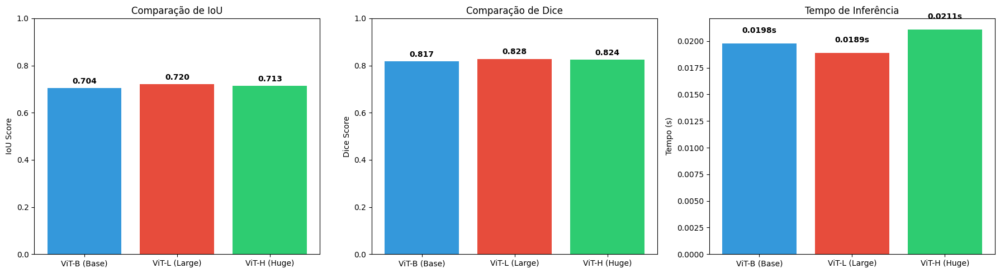

In [14]:
# Visualizar comparação
comparison_df = pd.DataFrame(model_comparison_results).T
comparison_df = comparison_df.round(4)

print("\n" + "="*60)
print("📊 COMPARAÇÃO ENTRE MODELOS SAM")
print("="*60)
print(comparison_df)
print("="*60)

# Gráfico comparativo
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

models = list(model_comparison_results.keys())
iou_scores = [model_comparison_results[m]['iou'] for m in models]
dice_scores = [model_comparison_results[m]['dice'] for m in models]
times = [model_comparison_results[m]['time'] for m in models]

# IoU
axes[0].bar(models, iou_scores, color=['#3498db', '#e74c3c', '#2ecc71'])
axes[0].set_ylabel('IoU Score')
axes[0].set_title('Comparação de IoU')
axes[0].set_ylim([0, 1])
for i, v in enumerate(iou_scores):
    axes[0].text(i, v + 0.02, f'{v:.3f}', ha='center', fontweight='bold')

# Dice
axes[1].bar(models, dice_scores, color=['#3498db', '#e74c3c', '#2ecc71'])
axes[1].set_ylabel('Dice Score')
axes[1].set_title('Comparação de Dice')
axes[1].set_ylim([0, 1])
for i, v in enumerate(dice_scores):
    axes[1].text(i, v + 0.02, f'{v:.3f}', ha='center', fontweight='bold')

# Tempo
axes[2].bar(models, times, color=['#3498db', '#e74c3c', '#2ecc71'])
axes[2].set_ylabel('Tempo (s)')
axes[2].set_title('Tempo de Inferência')
for i, v in enumerate(times):
    axes[2].text(i, v + 0.001, f'{v:.4f}s', ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

## 5. Avaliação SAM Pré-treinado com Diferentes Prompts

Vamos usar o **ViT-l** (melhor qualidade) e testar com:
- BBOX prompt
- Point prompt
- Automatic segmentation

In [19]:
# Usar ViT-l para o resto dos experimentos
sam_pretrained = sam_vit_l
print("✅ Usando SAM ViT-l para experimentos")

✅ Usando SAM ViT-l para experimentos


In [20]:
def evaluate_sam_with_prompt(model, dataset, prompt_type="bbox", num_samples=None):
    """
    Avalia SAM com diferentes tipos de prompts
    prompt_type: 'bbox', 'point', ou 'automatic'
    """
    if prompt_type == "automatic":
        mask_generator = SamAutomaticMaskGenerator(model)
    else:
        predictor = SamPredictor(model)

    metrics_list = []
    results = []

    n_samples = len(dataset) if num_samples is None else min(num_samples, len(dataset))

    print(f"🔍 Avaliando {n_samples} amostras com prompt={prompt_type}...")

    for i in tqdm(range(n_samples)):
        sample = dataset[i]
        image = sample['image']
        gt_mask = sample['mask']

        if prompt_type == "automatic":
            # Segmentação automática
            all_masks = mask_generator.generate(image)

            # Encontrar a máscara com maior IoU
            best_iou = 0
            best_mask = np.zeros_like(gt_mask)

            for mask_data in all_masks:
                mask = mask_data['segmentation'].astype(np.uint8)
                iou = calculate_iou(mask, gt_mask)
                if iou > best_iou:
                    best_iou = iou
                    best_mask = mask

            pred_mask = best_mask

        else:
            predictor.set_image(image)

            if prompt_type == "bbox":
                bbox = get_bbox_from_mask(gt_mask)
                if bbox is None:
                    continue

                masks, scores, logits = predictor.predict(
                    box=bbox,
                    multimask_output=False
                )
            else:  # point
                point = get_center_point_from_mask(gt_mask)
                if point is None:
                    continue

                point_labels = np.array([1])

                masks, scores, logits = predictor.predict(
                    point_coords=point,
                    point_labels=point_labels,
                    multimask_output=False
                )

            pred_mask = masks[0]

        metrics = calculate_metrics(pred_mask, gt_mask)
        metrics_list.append(metrics)

        results.append({
            'image': image,
            'gt_mask': gt_mask,
            'pred_mask': pred_mask,
            'metrics': metrics,
            'filename': sample['filename']
        })

    avg_metrics = {
        'iou': np.mean([m['iou'] for m in metrics_list]),
        'dice': np.mean([m['dice'] for m in metrics_list])
    }

    return avg_metrics, results

In [21]:
# Avaliar com BBOX
print("\n📦 === Avaliação com BBOX Prompt ===")
metrics_bbox, results_bbox = evaluate_sam_with_prompt(
    sam_pretrained, val_dataset, prompt_type="bbox", num_samples=50
)
print(f"  IoU: {metrics_bbox['iou']:.4f} | Dice: {metrics_bbox['dice']:.4f}")

# Avaliar com Point
print("\n📍 === Avaliação com Point Prompt ===")
metrics_point, results_point = evaluate_sam_with_prompt(
    sam_pretrained, val_dataset, prompt_type="point", num_samples=50
)
print(f"  IoU: {metrics_point['iou']:.4f} | Dice: {metrics_point['dice']:.4f}")

# Avaliar com Automatic (mais lento)
print("\n🤖 === Avaliação com Automatic Segmentation ===")
metrics_auto, results_auto = evaluate_sam_with_prompt(
    sam_pretrained, val_dataset, prompt_type="automatic", num_samples=20
)
print(f"  IoU: {metrics_auto['iou']:.4f} | Dice: {metrics_auto['dice']:.4f}")


📦 === Avaliação com BBOX Prompt ===
🔍 Avaliando 50 amostras com prompt=bbox...


100%|██████████| 50/50 [00:13<00:00,  3.73it/s]


  IoU: 0.7201 | Dice: 0.8275

📍 === Avaliação com Point Prompt ===
🔍 Avaliando 50 amostras com prompt=point...


100%|██████████| 50/50 [00:13<00:00,  3.73it/s]


  IoU: 0.4918 | Dice: 0.6006

🤖 === Avaliação com Automatic Segmentation ===
🔍 Avaliando 20 amostras com prompt=automatic...


100%|██████████| 20/20 [00:32<00:00,  1.63s/it]

  IoU: 0.4151 | Dice: 0.5075


## 6. Segmentação Iterativa com Refinamento Progressivo

Demonstra como adicionar pontos positivos e negativos progressivamente para refinar a segmentação.

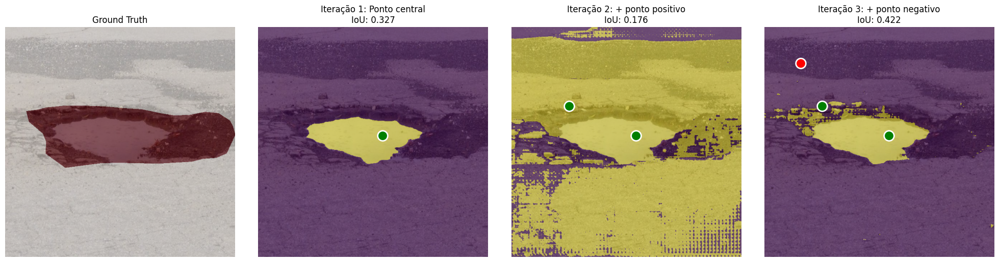

In [22]:
def demonstrate_iterative_segmentation(model, image, gt_mask):
    """
    Demonstra segmentação iterativa
    """
    predictor = SamPredictor(model)
    predictor.set_image(image)

    # Pegar pontos da máscara ground truth
    rows, cols = np.where(gt_mask > 0)
    if len(rows) == 0:
        return

    # Iterações
    iterations = [
        {"points": [[int(np.mean(cols)), int(np.mean(rows))]], "labels": [1], "title": "Iteração 1: Ponto central"},
        {"points": [[int(np.mean(cols)), int(np.mean(rows))], [cols[0], rows[0]]], "labels": [1, 1], "title": "Iteração 2: + ponto positivo"},
        {"points": [[int(np.mean(cols)), int(np.mean(rows))], [cols[0], rows[0]], [100, 100]], "labels": [1, 1, 0], "title": "Iteração 3: + ponto negativo"},
    ]

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # Imagem original
    axes[0].imshow(image)
    axes[0].imshow(gt_mask, alpha=0.5, cmap='Reds')
    axes[0].set_title("Ground Truth")
    axes[0].axis('off')

    for idx, iteration in enumerate(iterations):
        points = np.array(iteration["points"])
        labels = np.array(iteration["labels"])

        masks, scores, _ = predictor.predict(
            point_coords=points,
            point_labels=labels,
            multimask_output=False
        )

        axes[idx+1].imshow(image)
        axes[idx+1].imshow(masks[0], alpha=0.5)

        # Plotar pontos
        for (x, y), label in zip(points, labels):
            color = 'green' if label == 1 else 'red'
            axes[idx+1].scatter(x, y, color=color, s=200, edgecolors='white', linewidth=2)

        iou = calculate_iou(masks[0], gt_mask)
        axes[idx+1].set_title(f"{iteration['title']}\nIoU: {iou:.3f}")
        axes[idx+1].axis('off')

    plt.tight_layout()
    plt.show()

# Demonstrar com uma imagem
sample = val_dataset[0]
demonstrate_iterative_segmentation(sam_pretrained, sample['image'], sample['mask'])

## 7. Fine-tuning do SAM

Agora vamos realizar o fine-tuning completo do SAM para a tarefa específica de segmentação de buracos.

In [24]:
# Preparar modelo para fine-tuning
sam_finetuned = sam_model_registry["vit_l"](checkpoint="checkpoints/sam_vit_l_0b3195.pth").to(device)
sam_finetuned.train()

# Congelar image encoder
for param in sam_finetuned.image_encoder.parameters():
    param.requires_grad = False

# Treinar mask decoder e prompt encoder
for param in sam_finetuned.mask_decoder.parameters():
    param.requires_grad = True

for param in sam_finetuned.prompt_encoder.parameters():
    param.requires_grad = True

optimizer = Adam(sam_finetuned.mask_decoder.parameters(), lr=1e-5)
loss_fn = BCEWithLogitsLoss()

trainable_params = sum(p.numel() for p in sam_finetuned.parameters() if p.requires_grad)
print(f"✅ Modelo preparado para fine-tuning!")
print(f"📊 Parâmetros treináveis: {trainable_params:,}")

✅ Modelo preparado para fine-tuning!
📊 Parâmetros treináveis: 4,064,560


In [26]:
def train_sam_optimized(model, train_dataset, val_dataset, num_epochs=10, batch_size=4, accumulation_steps=4):
    """
    Treina o modelo SAM com otimizações de GPU

    Otimizações:
    - Batch processing
    - Gradient accumulation
    - Mixed precision (AMP)
    - Pin memory
    - Non-blocking transfers
    """
    from torch.cuda.amp import autocast, GradScaler

    transform = ResizeLongestSide(model.image_encoder.img_size)
    scaler = GradScaler()  # Para mixed precision

    train_losses = []
    val_metrics = []

    for epoch in range(num_epochs):
        model.train()
        epoch_losses = []

        print(f"\n📈 Época {epoch+1}/{num_epochs}")

        indices = np.random.permutation(len(train_dataset))
        batch_images = []
        batch_masks = []
        batch_bboxes = []

        optimizer.zero_grad()

        pbar = tqdm(indices, desc="Treinando")
        for step, idx in enumerate(pbar):
            sample = train_dataset[idx]
            image = sample['image']
            gt_mask = sample['mask']

            if gt_mask.sum() == 0:
                continue

            bbox = get_bbox_from_mask(gt_mask)
            if bbox is None:
                continue

            # Acumular batch
            batch_images.append(image)
            batch_masks.append(gt_mask)
            batch_bboxes.append(bbox)

            # Processar quando atingir batch_size
            if len(batch_images) == batch_size or step == len(indices) - 1:
                if len(batch_images) == 0:
                    continue

                # Preparar batch tensors
                input_images_tensor = [] # Lista para os tensores de imagem após pré-processamento
                gt_masks_torch = []
                bboxes_torch = []
                original_sizes = []

                for img, mask, bbox in zip(batch_images, batch_masks, batch_bboxes):
                    # Aplicar a transformação e converter para float32 e normalizar para o treinamento
                    input_image = transform.apply_image(img)
                    input_images_tensor.append(
                        torch.as_tensor(input_image, device=device, dtype=torch.float32).permute(2, 0, 1) / 255.0
                    )
                    gt_masks_torch.append(
                        torch.as_tensor(mask, device=device, dtype=torch.float32)
                    )
                    bbox_transformed = transform.apply_boxes(bbox[None, :], img.shape[:2])
                    bboxes_torch.append(
                        torch.as_tensor(bbox_transformed, device=device, dtype=torch.float32)
                    )
                    original_sizes.append(img.shape[:2])

                # Stack em batch
                input_batch = torch.stack(input_images_tensor)

                # Mixed precision training
                with autocast():
                    # Image embeddings
                    with torch.no_grad():
                        image_embeddings = model.image_encoder(input_batch)

                    total_loss = 0

                    # Processar cada item do batch
                    for i in range(len(batch_images)):
                        sparse_embeddings, dense_embeddings = model.prompt_encoder(
                            points=None,
                            boxes=bboxes_torch[i],
                            masks=None,
                        )

                        low_res_masks, _ = model.mask_decoder(
                            image_embeddings=image_embeddings[i:i+1],
                            image_pe=model.prompt_encoder.get_dense_pe(),
                            sparse_prompt_embeddings=sparse_embeddings,
                            dense_prompt_embeddings=dense_embeddings,
                            multimask_output=False,
                        )

                        upscaled_masks = model.postprocess_masks(
                            low_res_masks,
                            input_size=(input_images_tensor[i].shape[1], input_images_tensor[i].shape[2]), # Use shape of transformed input
                            original_size=original_sizes[i]
                        )

                        gt_mask_torch = gt_masks_torch[i].unsqueeze(0).unsqueeze(0)
                        loss = loss_fn(upscaled_masks, gt_mask_torch) + dice_loss(upscaled_masks, gt_mask_torch)
                        total_loss += loss

                    # Média do batch
                    total_loss = total_loss / len(batch_images)
                    # Dividir por accumulation steps
                    total_loss = total_loss / accumulation_steps

                # Backward com gradient scaling
                scaler.scale(total_loss).backward()

                # Update a cada accumulation_steps
                if (step + 1) % accumulation_steps == 0 or step == len(indices) - 1:
                    scaler.step(optimizer)
                    scaler.update()
                    optimizer.zero_grad()

                epoch_losses.append(total_loss.item() * accumulation_steps)
                pbar.set_postfix({'loss': f'{np.mean(epoch_losses):.4f}'})

                # Limpar batch
                batch_images = []
                batch_masks = []
                batch_bboxes = []

        avg_loss = np.mean(epoch_losses)
        train_losses.append(avg_loss)

        print(f"  Loss médio: {avg_loss:.4f}")

        # Validação (mantém igual)
        model.eval()
        val_iou_list = []
        val_dice_list = []

        with torch.no_grad():
            for i in range(min(30, len(val_dataset))):
                sample = val_dataset[i]
                image = sample['image'] # numpy array, likely uint8
                gt_mask = sample['mask']

                if gt_mask.sum() == 0:
                    continue

                input_image = transform.apply_image(image) # still numpy array, likely uint8 after resize
                # Convert to float and normalize, then add batch dimension
                input_image_torch = torch.as_tensor(input_image, dtype=torch.float32, device=device) / 255.0
                input_image_torch = input_image_torch.permute(2, 0, 1).contiguous()[None, :, :, :]

                image_embedding = model.image_encoder(input_image_torch)

                bbox = get_bbox_from_mask(gt_mask)
                if bbox is None:
                    continue

                bbox_transformed = transform.apply_boxes(bbox[None, :], image.shape[:2])
                bbox_torch = torch.as_tensor(bbox_transformed, dtype=torch.float, device=device)

                sparse_embeddings, dense_embeddings = model.prompt_encoder(
                    points=None,
                    boxes=bbox_torch,
                    masks=None,
                )

                low_res_masks, _ = model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                upscaled_masks = model.postprocess_masks(
                    low_res_masks,
                    input_size=(input_image.shape[0], input_image.shape[1]),
                    original_size=image.shape[:2]
                )

                pred_mask = (upscaled_masks[0, 0].cpu().numpy() > 0).astype(np.uint8)

                metrics = calculate_metrics(pred_mask, gt_mask)
                val_iou_list.append(metrics['iou'])
                val_dice_list.append(metrics['dice'])

        avg_val_iou = np.mean(val_iou_list) if val_iou_list else 0
        avg_val_dice = np.mean(val_dice_list) if val_dice_list else 0
        val_metrics.append({'iou': avg_val_iou, 'dice': avg_val_dice})

        print(f"  Validação - IoU: {avg_val_iou:.4f}, Dice: {avg_val_dice:.4f}")

    return train_losses, val_metrics

# Substituir a chamada por:
train_losses, val_metrics = train_sam_optimized(
    sam_finetuned,
    train_dataset,
    val_dataset,
    num_epochs=8,
    batch_size=12,           # Processa 12 imagens por vez
    accumulation_steps=4     # Batch efetivo = 4
)


📈 Época 1/8


Treinando: 100%|██████████| 720/720 [01:15<00:00,  9.52it/s, loss=0.2585]


  Loss médio: 0.2585
  Validação - IoU: 0.8251, Dice: 0.9012

📈 Época 2/8


Treinando: 100%|██████████| 720/720 [01:14<00:00,  9.62it/s, loss=0.1961]


  Loss médio: 0.1961
  Validação - IoU: 0.8509, Dice: 0.9184

📈 Época 3/8


Treinando: 100%|██████████| 720/720 [01:14<00:00,  9.60it/s, loss=0.1783]


  Loss médio: 0.1783
  Validação - IoU: 0.8439, Dice: 0.9125

📈 Época 4/8


Treinando: 100%|██████████| 720/720 [01:15<00:00,  9.58it/s, loss=0.1681]


  Loss médio: 0.1681
  Validação - IoU: 0.8485, Dice: 0.9165

📈 Época 5/8


Treinando: 100%|██████████| 720/720 [01:14<00:00,  9.62it/s, loss=0.1593]


  Loss médio: 0.1593
  Validação - IoU: 0.8540, Dice: 0.9193

📈 Época 6/8


Treinando: 100%|██████████| 720/720 [01:14<00:00,  9.64it/s, loss=0.1521]


  Loss médio: 0.1521
  Validação - IoU: 0.8506, Dice: 0.9173

📈 Época 7/8


Treinando: 100%|██████████| 720/720 [01:14<00:00,  9.64it/s, loss=0.1466]


  Loss médio: 0.1466
  Validação - IoU: 0.8462, Dice: 0.9139

📈 Época 8/8


Treinando: 100%|██████████| 720/720 [01:14<00:00,  9.63it/s, loss=0.1412]


  Loss médio: 0.1412
  Validação - IoU: 0.8514, Dice: 0.9178


In [28]:
import torch
import gc

print(f"Memória da GPU antes da limpeza: {torch.cuda.memory_allocated() / (1024**2):.2f} MB")

gc.collect()

# Liberar a memória cache da GPU
torch.cuda.empty_cache()

print(f"Memória da GPU depois da limpeza: {torch.cuda.memory_allocated() / (1024**2):.2f} MB")

Memória da GPU antes da limpeza: 5316.03 MB
Memória da GPU depois da limpeza: 5316.03 MB


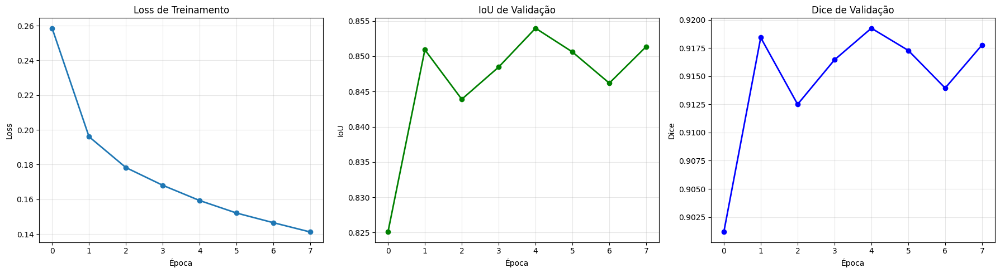

In [29]:
# Plotar curvas de treinamento
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(train_losses, marker='o', linewidth=2)
axes[0].set_xlabel('Época')
axes[0].set_ylabel('Loss')
axes[0].set_title('Loss de Treinamento')
axes[0].grid(True, alpha=0.3)

iou_vals = [m['iou'] for m in val_metrics]
axes[1].plot(iou_vals, marker='o', color='green', linewidth=2)
axes[1].set_xlabel('Época')
axes[1].set_ylabel('IoU')
axes[1].set_title('IoU de Validação')
axes[1].grid(True, alpha=0.3)

dice_vals = [m['dice'] for m in val_metrics]
axes[2].plot(dice_vals, marker='o', color='blue', linewidth=2)
axes[2].set_xlabel('Época')
axes[2].set_ylabel('Dice')
axes[2].set_title('Dice de Validação')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [30]:
# Salvar modelo
torch.save(sam_finetuned.state_dict(), 'sam_finetuned_complete.pth')
print("💾 Modelo salvo como 'sam_finetuned_complete.pth'")

💾 Modelo salvo como 'sam_finetuned_complete.pth'


## 8. Avaliação do Modelo Fine-tuned

Vamos avaliar o modelo fine-tuned com BBOX e Point prompts.

In [33]:
# Avaliar fine-tuned com BBOX
print("\n📦 === Avaliação SAM Fine-tuned com BBOX Prompt ===")
sam_finetuned.eval()
metrics_finetuned_bbox, results_finetuned_bbox = evaluate_sam_with_prompt(
    sam_finetuned, val_dataset, prompt_type="bbox", num_samples=50
)
print(f"  IoU: {metrics_finetuned_bbox['iou']:.4f} | Dice: {metrics_finetuned_bbox['dice']:.4f}")

# Avaliar fine-tuned com Point
print("\n📍 === Avaliação SAM Fine-tuned com Point Prompt ===")
metrics_finetuned_point, results_finetuned_point = evaluate_sam_with_prompt(
    sam_finetuned, val_dataset, prompt_type="point", num_samples=50
)
print(f"  IoU: {metrics_finetuned_point['iou']:.4f} | Dice: {metrics_finetuned_point['dice']:.4f}")

# Avaliar fine-tuned com Automatic
print("\n🤖 === Avaliação SAM Fine-tuned com Automatic Segmentation ===")
metrics_finetuned_auto, results_finetuned_auto = evaluate_sam_with_prompt(
    sam_finetuned, val_dataset, prompt_type="automatic", num_samples=20
)
print(f"  IoU: {metrics_finetuned_auto['iou']:.4f} | Dice: {metrics_finetuned_auto['dice']:.4f}")


📦 === Avaliação SAM Fine-tuned com BBOX Prompt ===
🔍 Avaliando 50 amostras com prompt=bbox...


100%|██████████| 50/50 [00:13<00:00,  3.73it/s]


  IoU: 0.8519 | Dice: 0.9183

📍 === Avaliação SAM Fine-tuned com Point Prompt ===
🔍 Avaliando 50 amostras com prompt=point...


100%|██████████| 50/50 [00:13<00:00,  3.73it/s]


  IoU: 0.5471 | Dice: 0.6489

🤖 === Avaliação SAM Fine-tuned com Automatic Segmentation ===
🔍 Avaliando 20 amostras com prompt=automatic...


100%|██████████| 20/20 [00:32<00:00,  1.62s/it]

  IoU: 0.4775 | Dice: 0.5695


## 9. Comparação Final: Todos os Métodos

In [34]:
# Criar tabela de comparação completa
final_comparison = pd.DataFrame({
    'Método': [
        'SAM Pré-treinado (BBOX)',
        'SAM Pré-treinado (Point)',
        'SAM Pré-treinado (Automatic)',
        'SAM Fine-tuned (BBOX)',
        'SAM Fine-tuned (Point)',
        'SAM Fine-tuned (Automatic)'
    ],
    'IoU': [
        metrics_bbox['iou'],
        metrics_point['iou'],
        metrics_auto['iou'],
        metrics_finetuned_bbox['iou'],
        metrics_finetuned_point['iou'],
        metrics_finetuned_auto['iou']
    ],
    'Dice': [
        metrics_bbox['dice'],
        metrics_point['dice'],
        metrics_auto['dice'],
        metrics_finetuned_bbox['dice'],
        metrics_finetuned_point['dice'],
        metrics_finetuned_auto['dice']
    ]
})

print("\n" + "="*70)
print("📊 COMPARAÇÃO FINAL - TODOS OS MÉTODOS")
print("="*70)
print(final_comparison.to_string(index=False))
print("="*70)

# Calcular melhorias
improvement_bbox_iou = ((metrics_finetuned_bbox['iou'] - metrics_bbox['iou']) / metrics_bbox['iou']) * 100
improvement_bbox_dice = ((metrics_finetuned_bbox['dice'] - metrics_bbox['dice']) / metrics_bbox['dice']) * 100

improvement_point_iou = ((metrics_finetuned_point['iou'] - metrics_point['iou']) / metrics_point['iou']) * 100
improvement_point_dice = ((metrics_finetuned_point['dice'] - metrics_point['dice']) / metrics_point['dice']) * 100

improvement_auto_iou = ((metrics_finetuned_auto['iou'] - metrics_auto['iou']) / metrics_auto['iou']) * 100
improvement_auto_dice = ((metrics_finetuned_auto['dice'] - metrics_auto['dice']) / metrics_auto['dice']) * 100

print(f"\n🚀 Melhoria com fine-tuning (BBOX):")
print(f"  IoU: {improvement_bbox_iou:+.2f}%")
print(f"  Dice: {improvement_bbox_dice:+.2f}%")

print(f"\n🚀 Melhoria com fine-tuning (Point):")
print(f"  IoU: {improvement_point_iou:+.2f}%")
print(f"  Dice: {improvement_point_dice:+.2f}%")

print(f"\n🚀 Melhoria com fine-tuning (Automatic):")
print(f"  IoU: {improvement_auto_iou:+.2f}%")
print(f"  Dice: {improvement_auto_dice:+.2f}%")


📊 COMPARAÇÃO FINAL - TODOS OS MÉTODOS
                      Método      IoU     Dice
     SAM Pré-treinado (BBOX) 0.720056 0.827532
    SAM Pré-treinado (Point) 0.491844 0.600625
SAM Pré-treinado (Automatic) 0.415058 0.507515
       SAM Fine-tuned (BBOX) 0.851928 0.918298
      SAM Fine-tuned (Point) 0.547081 0.648852
  SAM Fine-tuned (Automatic) 0.477455 0.569510

🚀 Melhoria com fine-tuning (BBOX):
  IoU: +18.31%
  Dice: +10.97%

🚀 Melhoria com fine-tuning (Point):
  IoU: +11.23%
  Dice: +8.03%

🚀 Melhoria com fine-tuning (Automatic):
  IoU: +15.03%
  Dice: +12.22%


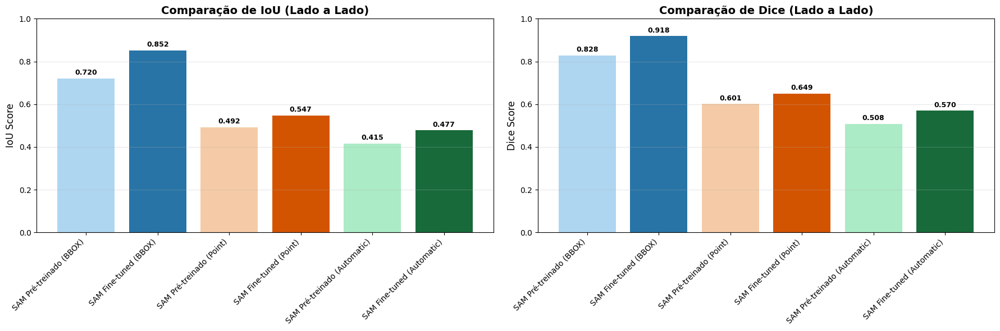

In [39]:
# Gráfico final comparativo
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Extrair dados originais
methods_orig = final_comparison['Método'].tolist()
iou_orig = final_comparison['IoU'].tolist()
dice_orig = final_comparison['Dice'].tolist()

# Definir nova ordem para agrupar pares (Pre-trained vs Fine-tuned)
# Índices originais: 0=Pre-Box, 1=Pre-Point, 2=Pre-Auto, 3=FT-Box, 4=FT-Point, 5=FT-Auto
new_order = [0, 3, 1, 4, 2, 5]

methods = [methods_orig[i] for i in new_order]
iou_scores = [iou_orig[i] for i in new_order]
dice_scores = [dice_orig[i] for i in new_order]

# Cores: Pares de (claro, escuro) para cada tipo
# Azul (Box), Laranja (Point), Verde (Auto)
colors = ['#aed6f1', '#2874a6', '#f5cba7', '#d35400', '#abebc6', '#186a3b']

# IoU
bars1 = axes[0].bar(range(len(methods)), iou_scores, color=colors)
axes[0].set_xticks(range(len(methods)))
axes[0].set_xticklabels(methods, rotation=45, ha='right')
axes[0].set_ylabel('IoU Score', fontsize=12)
axes[0].set_title('Comparação de IoU (Lado a Lado)', fontsize=14, fontweight='bold')
axes[0].set_ylim([0, 1])
axes[0].grid(axis='y', alpha=0.3)

for bar in bars1:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9)

# Dice
bars2 = axes[1].bar(range(len(methods)), dice_scores, color=colors)
axes[1].set_xticks(range(len(methods)))
axes[1].set_xticklabels(methods, rotation=45, ha='right')
axes[1].set_ylabel('Dice Score', fontsize=12)
axes[1].set_title('Comparação de Dice (Lado a Lado)', fontsize=14, fontweight='bold')
axes[1].set_ylim([0, 1])
axes[1].grid(axis='y', alpha=0.3)

for bar in bars2:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9)

plt.tight_layout()
plt.show()

FineTun of point segmentation

In [58]:
def train_sam_optimized_point(model, train_dataset, val_dataset, num_epochs=10, batch_size=4, accumulation_steps=4):
    """
    Treina o modelo SAM com POINT PROMPTS e otimizações de GPU
    """
    from torch.cuda.amp import autocast, GradScaler

    transform = ResizeLongestSide(model.image_encoder.img_size)
    scaler = GradScaler()

    train_losses = []
    val_metrics = []

    for epoch in range(num_epochs):
        model.train()
        epoch_losses = []

        print(f"\n📈 Época {epoch+1}/{num_epochs}")

        indices = np.random.permutation(len(train_dataset))
        batch_images = []
        batch_masks = []
        batch_points = []

        optimizer.zero_grad()

        pbar = tqdm(indices, desc="Treinando")
        for step, idx in enumerate(pbar):
            sample = train_dataset[idx]
            image = sample['image']
            gt_mask = sample['mask']

            if gt_mask.sum() == 0:
                continue

            # Extrair PONTO CENTRAL
            point = get_center_point_from_mask(gt_mask)
            if point is None:
                continue

            # Acumular batch
            batch_images.append(image)
            batch_masks.append(gt_mask)
            batch_points.append(point)  # Manter como [[x, y]]

            # Processar quando atingir batch_size
            if len(batch_images) == batch_size or step == len(indices) - 1:
                if len(batch_images) == 0:
                    continue

                # Preparar batch tensors
                input_images_tensor = []
                gt_masks_torch = []
                points_torch = []
                point_labels_torch = []
                original_sizes = []

                for img, mask, point in zip(batch_images, batch_masks, batch_points):
                    input_image = transform.apply_image(img)
                    input_images_tensor.append(
                        torch.as_tensor(input_image, device=device, dtype=torch.float32).permute(2, 0, 1) / 255.0
                    )
                    gt_masks_torch.append(
                        torch.as_tensor(mask, device=device, dtype=torch.float32)
                    )

                    # Transformar ponto - MANTER shape [[x, y]]
                    point_transformed = transform.apply_coords(point, img.shape[:2])
                    points_torch.append(
                        torch.as_tensor(point_transformed, device=device, dtype=torch.float32)  # Shape: (1, 2)
                    )
                    point_labels_torch.append(
                        torch.as_tensor([1], device=device, dtype=torch.int)  # Shape: (1,)
                    )
                    original_sizes.append(img.shape[:2])

                # Stack em batch
                input_batch = torch.stack(input_images_tensor)

                # Mixed precision training
                with autocast():
                    # Image embeddings
                    with torch.no_grad():
                        image_embeddings = model.image_encoder(input_batch)

                    total_loss = 0

                    # Processar cada item do batch
                    for i in range(len(batch_images)):
                        # Usar POINT PROMPT - formato correto com unsqueeze(0)!
                        sparse_embeddings, dense_embeddings = model.prompt_encoder(
                            points=(points_torch[i].unsqueeze(0), point_labels_torch[i].unsqueeze(0)),  # (1, 1, 2) e (1, 1)
                            boxes=None,
                            masks=None,
                        )

                        low_res_masks, _ = model.mask_decoder(
                            image_embeddings=image_embeddings[i:i+1],
                            image_pe=model.prompt_encoder.get_dense_pe(),
                            sparse_prompt_embeddings=sparse_embeddings,
                            dense_prompt_embeddings=dense_embeddings,
                            multimask_output=False,
                        )

                        upscaled_masks = model.postprocess_masks(
                            low_res_masks,
                            input_size=(input_images_tensor[i].shape[1], input_images_tensor[i].shape[2]),
                            original_size=original_sizes[i]
                        )

                        gt_mask_torch = gt_masks_torch[i].unsqueeze(0).unsqueeze(0)
                        loss = loss_fn(upscaled_masks, gt_mask_torch) + dice_loss(upscaled_masks, gt_mask_torch)
                        total_loss += loss

                    # Média do batch
                    total_loss = total_loss / len(batch_images)
                    total_loss = total_loss / accumulation_steps

                # Backward com gradient scaling
                scaler.scale(total_loss).backward()

                # Update a cada accumulation_steps
                if (step + 1) % accumulation_steps == 0 or step == len(indices) - 1:
                    scaler.step(optimizer)
                    scaler.update()
                    optimizer.zero_grad()

                epoch_losses.append(total_loss.item() * accumulation_steps)
                pbar.set_postfix({'loss': f'{np.mean(epoch_losses):.4f}'})

                # Limpar batch
                batch_images = []
                batch_masks = []
                batch_points = []

        avg_loss = np.mean(epoch_losses)
        train_losses.append(avg_loss)

        print(f"  Loss médio: {avg_loss:.4f}")

        # Validação com POINT prompts
        model.eval()
        val_iou_list = []
        val_dice_list = []

        with torch.no_grad():
            for i in range(min(30, len(val_dataset))):
                sample = val_dataset[i]
                image = sample['image']
                gt_mask = sample['mask']

                if gt_mask.sum() == 0:
                    continue

                input_image = transform.apply_image(image)
                input_image_torch = torch.as_tensor(input_image, dtype=torch.float32, device=device) / 255.0
                input_image_torch = input_image_torch.permute(2, 0, 1).contiguous()[None, :, :, :]

                image_embedding = model.image_encoder(input_image_torch)

                # Usar POINT
                point = get_center_point_from_mask(gt_mask)
                if point is None:
                    continue

                # Transformar mantendo shape [[x, y]]
                point_transformed = transform.apply_coords(point, image.shape[:2])
                point_torch = torch.as_tensor(point_transformed, dtype=torch.float, device=device)  # (1, 2)
                point_labels = torch.as_tensor([1], dtype=torch.int, device=device)  # (1,)

                sparse_embeddings, dense_embeddings = model.prompt_encoder(
                    points=(point_torch.unsqueeze(0), point_labels.unsqueeze(0)),
                    boxes=None,
                    masks=None,
                )

                low_res_masks, _ = model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                upscaled_masks = model.postprocess_masks(
                    low_res_masks,
                    input_size=(input_image.shape[0], input_image.shape[1]),
                    original_size=image.shape[:2]
                )

                pred_mask = (upscaled_masks[0, 0].cpu().numpy() > 0).astype(np.uint8)

                metrics = calculate_metrics(pred_mask, gt_mask)
                val_iou_list.append(metrics['iou'])
                val_dice_list.append(metrics['dice'])

        avg_val_iou = np.mean(val_iou_list) if val_iou_list else 0
        avg_val_dice = np.mean(val_dice_list) if val_dice_list else 0
        val_metrics.append({'iou': avg_val_iou, 'dice': avg_val_dice})

        print(f"  Validação - IoU: {avg_val_iou:.4f}, Dice: {avg_val_dice:.4f}")

    return train_losses, val_metrics

# Executar
print("🚀 Iniciando fine-tuning com POINT prompts...")
train_losses_point, val_metrics_point = train_sam_optimized_point(
    sam_finetuned,
    train_dataset,
    val_dataset,
    num_epochs=5,
    batch_size=6,
    accumulation_steps=4
)

print("\n✅ Fine-tuning com POINT concluído!")

🚀 Iniciando fine-tuning com POINT prompts...

📈 Época 1/5


Treinando:   9%|▉         | 64/720 [00:06<01:10,  9.32it/s, loss=0.2205]


KeyboardInterrupt: 

In [52]:
# Avaliar o modelo após o fine-tuning com Point Prompts
print("\n📍 === Avaliação SAM Fine-tuned (POINT) - Resultados Finais ===")

# Avaliar na validação
metrics_finetuned_point, results_finetuned_point = evaluate_sam_with_prompt(
    sam_finetuned, val_dataset, prompt_type="point", num_samples=50
)

print(f"  IoU Final: {metrics_finetuned_point['iou']:.4f}")
print(f"  Dice Final: {metrics_finetuned_point['dice']:.4f}")


📍 === Avaliação SAM Fine-tuned (POINT) - Resultados Finais ===
🔍 Avaliando 50 amostras com prompt=point...


100%|██████████| 50/50 [00:13<00:00,  3.72it/s]

  IoU Final: 0.7078
  Dice Final: 0.8103


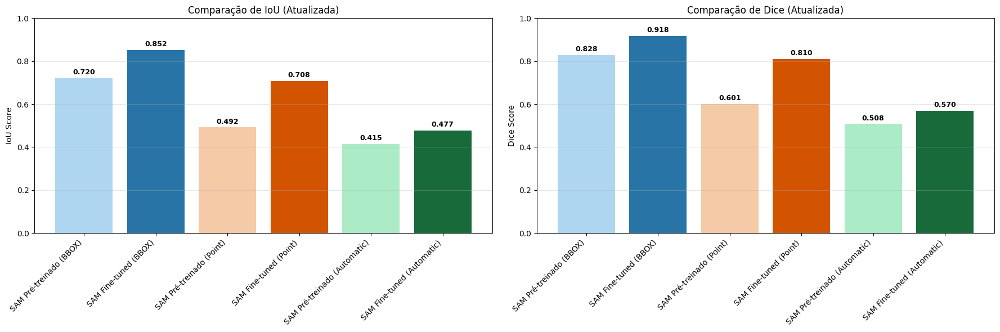

In [53]:
# Atualizar tabela de comparação com os resultados mais recentes
final_comparison = pd.DataFrame({
    'Método': [
        'SAM Pré-treinado (BBOX)',
        'SAM Pré-treinado (Point)',
        'SAM Pré-treinado (Automatic)',
        'SAM Fine-tuned (BBOX)',
        'SAM Fine-tuned (Point)',
        'SAM Fine-tuned (Automatic)'
    ],
    'IoU': [
        metrics_bbox['iou'],
        metrics_point['iou'],
        metrics_auto['iou'],
        metrics_finetuned_bbox['iou'],
        metrics_finetuned_point['iou'],
        metrics_finetuned_auto['iou']
    ],
    'Dice': [
        metrics_bbox['dice'],
        metrics_point['dice'],
        metrics_auto['dice'],
        metrics_finetuned_bbox['dice'],
        metrics_finetuned_point['dice'],
        metrics_finetuned_auto['dice']
    ]
})

# Gráfico comparativo atualizado
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Dados
methods_orig = final_comparison['Método'].tolist()
iou_orig = final_comparison['IoU'].tolist()
dice_orig = final_comparison['Dice'].tolist()

# Ordem: Pre-Box, FT-Box, Pre-Point, FT-Point, Pre-Auto, FT-Auto
new_order = [0, 3, 1, 4, 2, 5]

methods = [methods_orig[i] for i in new_order]
iou_scores = [iou_orig[i] for i in new_order]
dice_scores = [dice_orig[i] for i in new_order]

colors = ['#aed6f1', '#2874a6', '#f5cba7', '#d35400', '#abebc6', '#186a3b']

# Plot IoU
bars1 = axes[0].bar(range(len(methods)), iou_scores, color=colors)
axes[0].set_xticks(range(len(methods)))
axes[0].set_xticklabels(methods, rotation=45, ha='right')
axes[0].set_ylabel('IoU Score')
axes[0].set_title('Comparação de IoU (Atualizada)')
axes[0].set_ylim([0, 1])
axes[0].grid(axis='y', alpha=0.3)

for bar in bars1:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9)

# Plot Dice
bars2 = axes[1].bar(range(len(methods)), dice_scores, color=colors)
axes[1].set_xticks(range(len(methods)))
axes[1].set_xticklabels(methods, rotation=45, ha='right')
axes[1].set_ylabel('Dice Score')
axes[1].set_title('Comparação de Dice (Atualizada)')
axes[1].set_ylim([0, 1])
axes[1].grid(axis='y', alpha=0.3)

for bar in bars2:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9)

plt.tight_layout()
plt.show()

Teste

In [60]:
# Preparar modelo para fine-tuning
sam_finetuned_2 = sam_model_registry["vit_l"](checkpoint="checkpoints/sam_vit_l_0b3195.pth").to(device)
sam_finetuned_2.train()

# Congelar image encoder
for param in sam_finetuned_2.image_encoder.parameters():
    param.requires_grad = False

# Treinar mask decoder e prompt encoder
for param in sam_finetuned_2.mask_decoder.parameters():
    param.requires_grad = True

for param in sam_finetuned_2.prompt_encoder.parameters():
    param.requires_grad = True

optimizer = Adam(sam_finetuned_2.mask_decoder.parameters(), lr=1e-5)
loss_fn = BCEWithLogitsLoss()

trainable_params = sum(p.numel() for p in sam_finetuned_2.parameters() if p.requires_grad)
print(f"✅ Modelo preparado para fine-tuning!")
print(f"📊 Parâmetros treináveis: {trainable_params:,}")

✅ Modelo preparado para fine-tuning!
📊 Parâmetros treináveis: 4,064,560


In [61]:
def train_sam_optimized_point(model, train_dataset, val_dataset, num_epochs=10, batch_size=4, accumulation_steps=4):
    """
    Treina o modelo SAM com POINT PROMPTS e otimizações de GPU
    """
    from torch.cuda.amp import autocast, GradScaler

    transform = ResizeLongestSide(model.image_encoder.img_size)
    scaler = GradScaler()

    train_losses = []
    val_metrics = []

    for epoch in range(num_epochs):
        model.train()
        epoch_losses = []

        print(f"\n📈 Época {epoch+1}/{num_epochs}")

        indices = np.random.permutation(len(train_dataset))
        batch_images = []
        batch_masks = []
        batch_points = []

        optimizer.zero_grad()

        pbar = tqdm(indices, desc="Treinando")
        for step, idx in enumerate(pbar):
            sample = train_dataset[idx]
            image = sample['image']
            gt_mask = sample['mask']

            if gt_mask.sum() == 0:
                continue

            # Extrair PONTO CENTRAL
            point = get_center_point_from_mask(gt_mask)
            if point is None:
                continue

            # Acumular batch
            batch_images.append(image)
            batch_masks.append(gt_mask)
            batch_points.append(point)  # Manter como [[x, y]]

            # Processar quando atingir batch_size
            if len(batch_images) == batch_size or step == len(indices) - 1:
                if len(batch_images) == 0:
                    continue

                # Preparar batch tensors
                input_images_tensor = []
                gt_masks_torch = []
                points_torch = []
                point_labels_torch = []
                original_sizes = []

                for img, mask, point in zip(batch_images, batch_masks, batch_points):
                    input_image = transform.apply_image(img)
                    input_images_tensor.append(
                        torch.as_tensor(input_image, device=device, dtype=torch.float32).permute(2, 0, 1) / 255.0
                    )
                    gt_masks_torch.append(
                        torch.as_tensor(mask, device=device, dtype=torch.float32)
                    )

                    # Transformar ponto - MANTER shape [[x, y]]
                    point_transformed = transform.apply_coords(point, img.shape[:2])
                    points_torch.append(
                        torch.as_tensor(point_transformed, device=device, dtype=torch.float32)  # Shape: (1, 2)
                    )
                    point_labels_torch.append(
                        torch.as_tensor([1], device=device, dtype=torch.int)  # Shape: (1,)
                    )
                    original_sizes.append(img.shape[:2])

                # Stack em batch
                input_batch = torch.stack(input_images_tensor)

                # Mixed precision training
                with autocast():
                    # Image embeddings
                    with torch.no_grad():
                        image_embeddings = model.image_encoder(input_batch)

                    total_loss = 0

                    # Processar cada item do batch
                    for i in range(len(batch_images)):
                        # Usar POINT PROMPT - formato correto com unsqueeze(0)!
                        sparse_embeddings, dense_embeddings = model.prompt_encoder(
                            points=(points_torch[i].unsqueeze(0), point_labels_torch[i].unsqueeze(0)),  # (1, 1, 2) e (1, 1)
                            boxes=None,
                            masks=None,
                        )

                        low_res_masks, _ = model.mask_decoder(
                            image_embeddings=image_embeddings[i:i+1],
                            image_pe=model.prompt_encoder.get_dense_pe(),
                            sparse_prompt_embeddings=sparse_embeddings,
                            dense_prompt_embeddings=dense_embeddings,
                            multimask_output=False,
                        )

                        upscaled_masks = model.postprocess_masks(
                            low_res_masks,
                            input_size=(input_images_tensor[i].shape[1], input_images_tensor[i].shape[2]),
                            original_size=original_sizes[i]
                        )

                        gt_mask_torch = gt_masks_torch[i].unsqueeze(0).unsqueeze(0)
                        loss = loss_fn(upscaled_masks, gt_mask_torch) + dice_loss(upscaled_masks, gt_mask_torch)
                        total_loss += loss

                    # Média do batch
                    total_loss = total_loss / len(batch_images)
                    total_loss = total_loss / accumulation_steps

                # Backward com gradient scaling
                scaler.scale(total_loss).backward()

                # Update a cada accumulation_steps
                if (step + 1) % accumulation_steps == 0 or step == len(indices) - 1:
                    scaler.step(optimizer)
                    scaler.update()
                    optimizer.zero_grad()

                epoch_losses.append(total_loss.item() * accumulation_steps)
                pbar.set_postfix({'loss': f'{np.mean(epoch_losses):.4f}'})

                # Limpar batch
                batch_images = []
                batch_masks = []
                batch_points = []

        avg_loss = np.mean(epoch_losses)
        train_losses.append(avg_loss)

        print(f"  Loss médio: {avg_loss:.4f}")

        # Validação com POINT prompts
        model.eval()
        val_iou_list = []
        val_dice_list = []

        with torch.no_grad():
            for i in range(min(30, len(val_dataset))):
                sample = val_dataset[i]
                image = sample['image']
                gt_mask = sample['mask']

                if gt_mask.sum() == 0:
                    continue

                input_image = transform.apply_image(image)
                input_image_torch = torch.as_tensor(input_image, dtype=torch.float32, device=device) / 255.0
                input_image_torch = input_image_torch.permute(2, 0, 1).contiguous()[None, :, :, :]

                image_embedding = model.image_encoder(input_image_torch)

                # Usar POINT
                point = get_center_point_from_mask(gt_mask)
                if point is None:
                    continue

                # Transformar mantendo shape [[x, y]]
                point_transformed = transform.apply_coords(point, image.shape[:2])
                point_torch = torch.as_tensor(point_transformed, dtype=torch.float, device=device)  # (1, 2)
                point_labels = torch.as_tensor([1], dtype=torch.int, device=device)  # (1,)

                sparse_embeddings, dense_embeddings = model.prompt_encoder(
                    points=(point_torch.unsqueeze(0), point_labels.unsqueeze(0)),
                    boxes=None,
                    masks=None,
                )

                low_res_masks, _ = model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                upscaled_masks = model.postprocess_masks(
                    low_res_masks,
                    input_size=(input_image.shape[0], input_image.shape[1]),
                    original_size=image.shape[:2]
                )

                pred_mask = (upscaled_masks[0, 0].cpu().numpy() > 0).astype(np.uint8)

                metrics = calculate_metrics(pred_mask, gt_mask)
                val_iou_list.append(metrics['iou'])
                val_dice_list.append(metrics['dice'])

        avg_val_iou = np.mean(val_iou_list) if val_iou_list else 0
        avg_val_dice = np.mean(val_dice_list) if val_dice_list else 0
        val_metrics.append({'iou': avg_val_iou, 'dice': avg_val_dice})

        print(f"  Validação - IoU: {avg_val_iou:.4f}, Dice: {avg_val_dice:.4f}")

    return train_losses, val_metrics

# Executar
print("🚀 Iniciando fine-tuning com POINT prompts...")
train_losses_point, val_metrics_point = train_sam_optimized_point(
    sam_finetuned_2,
    train_dataset,
    val_dataset,
    num_epochs=8,
    batch_size=6,
    accumulation_steps=4
)

print("\n✅ Fine-tuning com POINT concluído!")

🚀 Iniciando fine-tuning com POINT prompts...

📈 Época 1/8


Treinando: 100%|██████████| 720/720 [01:21<00:00,  8.84it/s, loss=0.7664]


  Loss médio: 0.7664
  Validação - IoU: 0.5956, Dice: 0.7091

📈 Época 2/8


Treinando: 100%|██████████| 720/720 [01:21<00:00,  8.87it/s, loss=0.5795]


  Loss médio: 0.5795
  Validação - IoU: 0.6522, Dice: 0.7603

📈 Época 3/8


Treinando: 100%|██████████| 720/720 [01:21<00:00,  8.86it/s, loss=0.4944]


  Loss médio: 0.4944
  Validação - IoU: 0.6702, Dice: 0.7765

📈 Época 4/8


Treinando: 100%|██████████| 720/720 [01:21<00:00,  8.86it/s, loss=0.4414]


  Loss médio: 0.4414
  Validação - IoU: 0.6808, Dice: 0.7856

📈 Época 5/8


Treinando: 100%|██████████| 720/720 [01:21<00:00,  8.88it/s, loss=0.4071]


  Loss médio: 0.4071
  Validação - IoU: 0.6951, Dice: 0.7981

📈 Época 6/8


Treinando: 100%|██████████| 720/720 [01:21<00:00,  8.87it/s, loss=0.3806]


  Loss médio: 0.3806
  Validação - IoU: 0.7028, Dice: 0.8038

📈 Época 7/8


Treinando: 100%|██████████| 720/720 [01:21<00:00,  8.84it/s, loss=0.3628]


  Loss médio: 0.3628
  Validação - IoU: 0.7096, Dice: 0.8092

📈 Época 8/8


Treinando: 100%|██████████| 720/720 [01:21<00:00,  8.84it/s, loss=0.3406]


  Loss médio: 0.3406
  Validação - IoU: 0.7169, Dice: 0.8149

✅ Fine-tuning com POINT concluído!


🔄 Avaliando modelo sam_finetuned_2...
📍 Avaliando com Point Prompt...
🔍 Avaliando 50 amostras com prompt=point...


100%|██████████| 50/50 [00:13<00:00,  3.71it/s]


📦 Avaliando com BBOX Prompt...
🔍 Avaliando 50 amostras com prompt=bbox...


100%|██████████| 50/50 [00:13<00:00,  3.73it/s]


🤖 Avaliando com Automatic Prompt...
🔍 Avaliando 20 amostras com prompt=automatic...


100%|██████████| 20/20 [00:28<00:00,  1.41s/it]



📊 RESULTADOS DO MODELO SAM_FINETUNED_2
                    Método      IoU     Dice
       Pré-treinado (BBOX) 0.720056 0.827532
     FT Point-Tuned (BBOX) 0.827147 0.903174
      Pré-treinado (Point) 0.491844 0.600625
    FT Point-Tuned (Point) 0.660209 0.766806
  Pré-treinado (Automatic) 0.415058 0.507515
FT Point-Tuned (Automatic) 0.457820 0.535423


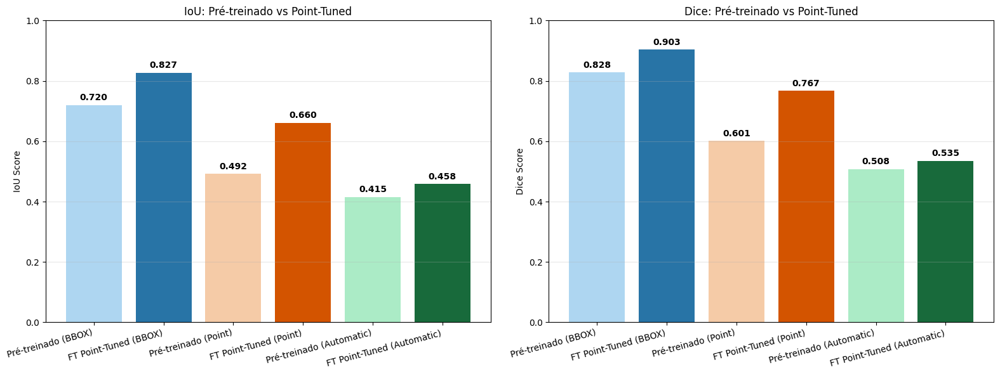

In [65]:
# 1. Avaliar o modelo sam_finetuned_2 (Treinado com Points)
print("🔄 Avaliando modelo sam_finetuned_2...")

sam_finetuned_2.eval()

# Avaliação com Point
print("📍 Avaliando com Point Prompt...")
metrics_ft2_point, _ = evaluate_sam_with_prompt(
    sam_finetuned_2, val_dataset, prompt_type="point", num_samples=50
)

# Avaliação com BBOX (para ver o impacto cruzado)
print("📦 Avaliando com BBOX Prompt...")
metrics_ft2_bbox, _ = evaluate_sam_with_prompt(
    sam_finetuned_2, val_dataset, prompt_type="bbox", num_samples=50
)

# Avaliação com Automatic
print("🤖 Avaliando com Automatic Prompt...")
metrics_ft2_auto, _ = evaluate_sam_with_prompt(
    sam_finetuned_2, val_dataset, prompt_type="automatic", num_samples=20
)

# 2. Criar DataFrame Comparativo
# Vamos comparar o Pré-treinado vs o SAM Fine-tuned 2 (Point-Tuned)
final_comparison_2 = pd.DataFrame({
    'Método': [
        'Pré-treinado (BBOX)',
        'FT Point-Tuned (BBOX)', # Como o modelo de pontos se sai em boxes
        'Pré-treinado (Point)',
        'FT Point-Tuned (Point)', # Como o modelo de pontos se sai em pontos
        'Pré-treinado (Automatic)', # Novo
        'FT Point-Tuned (Automatic)' # Novo
    ],
    'IoU': [
        metrics_bbox['iou'],
        metrics_ft2_bbox['iou'],
        metrics_point['iou'],
        metrics_ft2_point['iou'],
        metrics_auto['iou'],
        metrics_ft2_auto['iou']
    ],
    'Dice': [
        metrics_bbox['dice'],
        metrics_ft2_bbox['dice'],
        metrics_point['dice'],
        metrics_ft2_point['dice'],
        metrics_auto['dice'],
        metrics_ft2_auto['dice']
    ]
})

print("\n" + "="*60)
print("📊 RESULTADOS DO MODELO SAM_FINETUNED_2")
print("="*60)
print(final_comparison_2.to_string(index=False))
print("="*60)

# 3. Gráfico Comparativo
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

methods = final_comparison_2['Método'].tolist()
iou_scores = final_comparison_2['IoU'].tolist()
dice_scores = final_comparison_2['Dice'].tolist()

# Cores: Azul (Box), Laranja (Point), Verde (Auto)
# Tom claro = Pre, Tom escuro = FT
colors = ['#aed6f1', '#2874a6', '#f5cba7', '#d35400', '#abebc6', '#186a3b']

# Plot IoU
bars1 = axes[0].bar(range(len(methods)), iou_scores, color=colors)
axes[0].set_xticks(range(len(methods)))
axes[0].set_xticklabels(methods, rotation=15, ha='right')
axes[0].set_ylabel('IoU Score')
axes[0].set_title('IoU: Pré-treinado vs Point-Tuned')
axes[0].set_ylim([0, 1])
axes[0].grid(axis='y', alpha=0.3)

for bar in bars1:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontweight='bold')

# Plot Dice
bars2 = axes[1].bar(range(len(methods)), dice_scores, color=colors)
axes[1].set_xticks(range(len(methods)))
axes[1].set_xticklabels(methods, rotation=15, ha='right')
axes[1].set_ylabel('Dice Score')
axes[1].set_title('Dice: Pré-treinado vs Point-Tuned')
axes[1].set_ylim([0, 1])
axes[1].grid(axis='y', alpha=0.3)

for bar in bars2:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

## 10. Grounded-SAM: Segmentação com Text Prompts

Implementação do Grounded-SAM usando **Grounding DINO** para detectar objetos a partir de texto + **SAM** para segmentação precisa.

**Fluxo**: Texto "pothole" → Grounding DINO → Bounding Boxes → SAM → Máscaras

In [36]:
# Download Grounding DINO
try:
    from groundingdino.util.inference import Model as GroundingDINO
    import supervision as sv

    grounding_dino_config_url = "https://raw.githubusercontent.com/IDEA-Research/GroundingDINO/main/groundingdino/config/GroundingDINO_SwinT_OGC.py"
    grounding_dino_checkpoint_url = "https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth"

    config_path = "GroundingDINO_SwinT_OGC.py"
    checkpoint_path_gdino = "groundingdino_swint_ogc.pth"

    if not os.path.exists(config_path):
        print("⬇️  Baixando config do Grounding DINO...")
        urllib.request.urlretrieve(grounding_dino_config_url, config_path)

    if not os.path.exists(checkpoint_path_gdino):
        print("⬇️  Baixando checkpoint do Grounding DINO...")
        urllib.request.urlretrieve(grounding_dino_checkpoint_url, checkpoint_path_gdino)

    print("✅ Grounding DINO pronto!")

    # Carregar Grounding DINO
    grounding_dino_model = GroundingDINO(
        model_config_path=config_path,
        model_checkpoint_path=checkpoint_path_gdino
    )

    GROUNDED_SAM_AVAILABLE = True
    print("✅ Grounding DINO carregado!")

except Exception as e:
    print(f"⚠️  Grounded-SAM não disponível: {e}")
    print("Pulando esta seção...")
    GROUNDED_SAM_AVAILABLE = False

⬇️  Baixando config do Grounding DINO...
⬇️  Baixando checkpoint do Grounding DINO...
✅ Grounding DINO pronto!
final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

✅ Grounding DINO carregado!


In [37]:
if GROUNDED_SAM_AVAILABLE:
    def evaluate_grounded_sam(text_prompt, sam_model, gdino_model, dataset, num_samples=20):
        """
        Avalia Grounded-SAM com text prompts
        """
        sam_predictor = SamPredictor(sam_model)

        metrics_list = []
        results = []

        print(f"🔍 Avaliando Grounded-SAM com texto: '{text_prompt}'")

        for i in tqdm(range(min(num_samples, len(dataset)))):
            sample = dataset[i]
            image = sample['image']
            gt_mask = sample['mask']

            # Grounding DINO detecta objetos
            detections = gdino_model.predict_with_classes(
                image=image,
                classes=[text_prompt],
                box_threshold=0.25,
                text_threshold=0.25
            )

            if len(detections.xyxy) == 0:
                # Não detectou nada, usar máscara vazia
                pred_mask = np.zeros_like(gt_mask)
            else:
                # SAM segmenta usando as boxes
                sam_predictor.set_image(image)

                # Pegar a box com maior confiança
                best_box = detections.xyxy[0]

                masks, scores, _ = sam_predictor.predict(
                    box=best_box,
                    multimask_output=False
                )

                pred_mask = masks[0]

            metrics = calculate_metrics(pred_mask, gt_mask)
            metrics_list.append(metrics)

            results.append({
                'image': image,
                'gt_mask': gt_mask,
                'pred_mask': pred_mask,
                'metrics': metrics,
                'filename': sample['filename']
            })

        avg_metrics = {
            'iou': np.mean([m['iou'] for m in metrics_list]),
            'dice': np.mean([m['dice'] for m in metrics_list])
        }

        return avg_metrics, results

    # Testar com diferentes prompts
    text_prompts = ["pothole", "hole", "road damage"]

    grounded_results = {}

    for prompt in text_prompts:
        print(f"\n🔤 === Testando prompt: '{prompt}' ===")
        metrics, results = evaluate_grounded_sam(
            prompt, sam_pretrained, grounding_dino_model, val_dataset, num_samples=20
        )
        grounded_results[prompt] = metrics
        print(f"  IoU: {metrics['iou']:.4f} | Dice: {metrics['dice']:.4f}")

    # Comparar resultados
    print("\n" + "="*60)
    print("📊 RESULTADOS GROUNDED-SAM")
    print("="*60)
    for prompt, metrics in grounded_results.items():
        print(f"'{prompt}': IoU={metrics['iou']:.4f}, Dice={metrics['dice']:.4f}")
    print("="*60)
else:
    print("⏭️  Pulando Grounded-SAM (não disponível)")


🔤 === Testando prompt: 'pothole' ===
🔍 Avaliando Grounded-SAM com texto: 'pothole'


100%|██████████| 20/20 [00:09<00:00,  2.08it/s]


  IoU: 0.4908 | Dice: 0.5806

🔤 === Testando prompt: 'hole' ===
🔍 Avaliando Grounded-SAM com texto: 'hole'


100%|██████████| 20/20 [00:08<00:00,  2.44it/s]


  IoU: 0.4170 | Dice: 0.4976

🔤 === Testando prompt: 'road damage' ===
🔍 Avaliando Grounded-SAM com texto: 'road damage'


100%|██████████| 20/20 [00:08<00:00,  2.45it/s]

  IoU: 0.1444 | Dice: 0.2181

📊 RESULTADOS GROUNDED-SAM
'pothole': IoU=0.4908, Dice=0.5806
'hole': IoU=0.4170, Dice=0.4976
'road damage': IoU=0.1444, Dice=0.2181


🖼️ Gerando predições Grounded-SAM para 3 amostras...


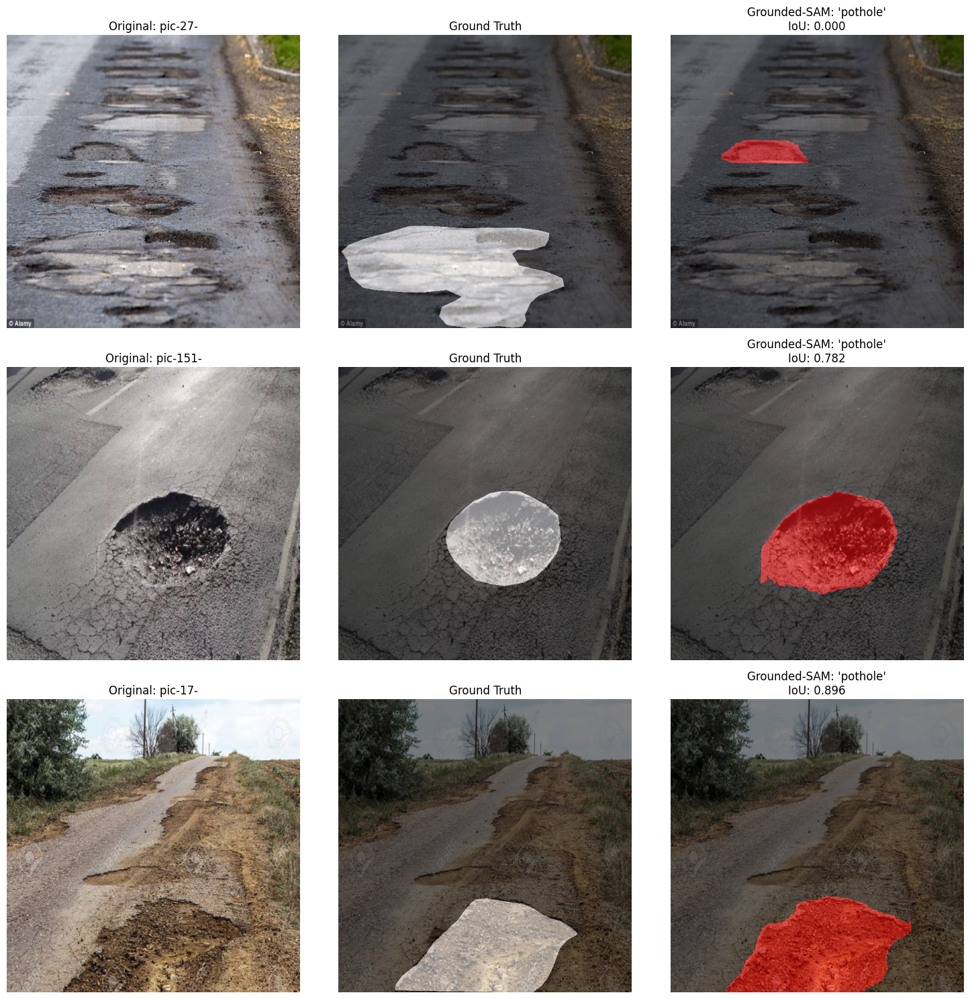

In [71]:
import random

# Helper function for plotting (copying for self-containment)
def plot_mask_overlay(ax, image, mask, title, color='red', alpha=0.5):
    ax.imshow(image)
    if mask.any():
        overlay_mask = np.zeros_like(image, dtype=np.uint8)
        if color == 'red': # Predições
            overlay_mask[mask == 1] = [255, 0, 0] # Vermelho
        elif color == 'white': # Ground Truth
            overlay_mask[mask == 1] = [255, 255, 255] # Branco

        blended_image = cv2.addWeighted(image, 1 - alpha, overlay_mask, alpha, 0)
        ax.imshow(blended_image)
    ax.set_title(title)
    ax.axis('off')

# Assegurar que os modelos estão em modo de avaliação
sam_finetuned.eval()
# grounding_dino_model já deve estar em eval por padrão

# Parâmetros para Grounding DINO (usando os otimizados)
text_prompt = "pothole"
box_threshold = 0.25 # Valor otimizado
text_threshold = 0.25 # Valor otimizado

num_samples = 3
print(f"🖼️ Gerando predições Grounded-SAM para {num_samples} amostras...")

# Seleciona índices aleatórios do conjunto de validação
indices = random.sample(range(len(val_dataset)), num_samples)

fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))
# Garante que axes seja 2D mesmo para 1 amostra
if num_samples == 1:
    axes = np.expand_dims(axes, axis=0)

for row_idx, idx in enumerate(indices):
    sample = val_dataset[idx]
    image = sample['image']
    gt_mask = sample['mask']
    gt_mask_bool = gt_mask > 0

    # --- Coluna 0: Imagem Original ---
    axes[row_idx, 0].imshow(image)
    axes[row_idx, 0].set_title(f"Original: {sample['filename'].split('_')[0]}")
    axes[row_idx, 0].axis('off')

    # --- Coluna 1: Ground Truth (overlay branco) ---
    plot_mask_overlay(axes[row_idx, 1], image, gt_mask_bool, "Ground Truth", color='white')

    # --- Coluna 2: Predição Grounded-SAM ---
    pred_mask = np.zeros_like(gt_mask_bool)
    iou = 0.0

    # Grounding DINO detecta objetos
    detections = grounding_dino_model.predict_with_classes(
        image=image,
        classes=[text_prompt],
        box_threshold=box_threshold,
        text_threshold=text_threshold
    )

    if len(detections.xyxy) > 0:
        # SAM segmenta usando a box de maior confiança (a primeira, se ordenado)
        predictor = SamPredictor(sam_finetuned) # Usar sam_finetuned
        predictor.set_image(image)

        # Pega a primeira caixa detectada (assumindo que seja a mais relevante)
        best_box = detections.xyxy[0]

        masks, scores, _ = predictor.predict(
            box=best_box,
            multimask_output=False
        )
        pred_mask = masks[0]
        iou = calculate_metrics(pred_mask, gt_mask_bool)['iou']

    plot_mask_overlay(axes[row_idx, 2], image, pred_mask, f"Grounded-SAM: '{text_prompt}'\nIoU: {iou:.3f}", color='red')

plt.tight_layout()
plt.show()

## 11. Visualizações Comparativas Finais

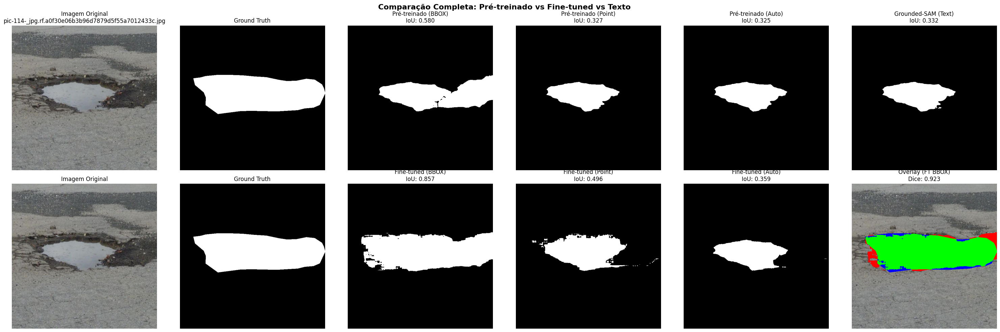

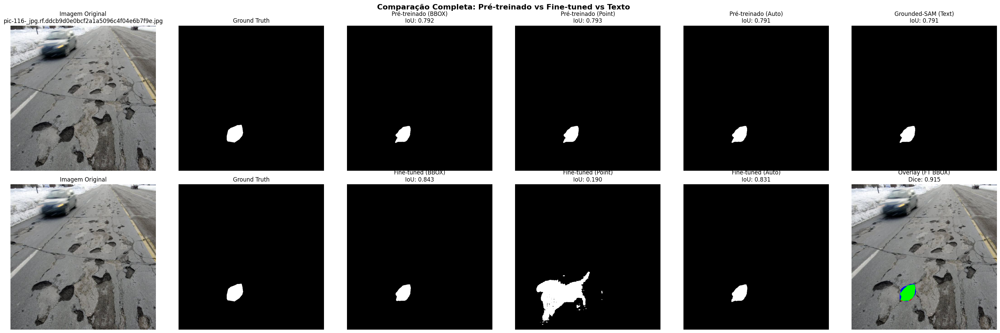

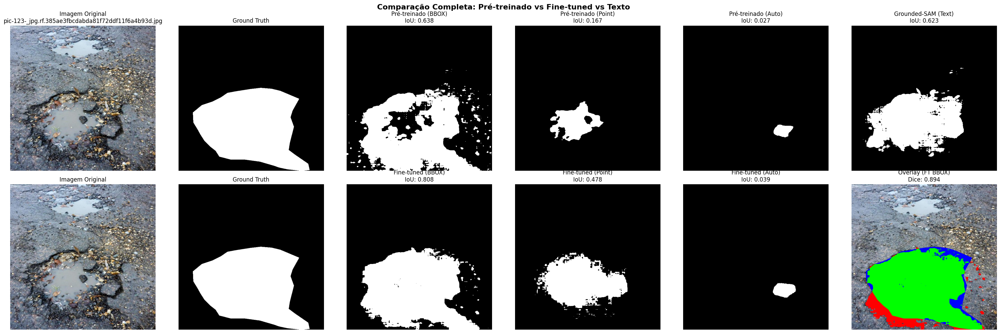

In [66]:
def visualize_all_methods(idx):
    """Visualiza todos os métodos lado a lado"""

    # Layout: 2 linhas x 6 colunas
    # Col 0: Orig, Col 1: GT, Col 2: Bbox, Col 3: Point, Col 4: Auto, Col 5: Extra (Grounded/Overlay)
    fig, axes = plt.subplots(2, 6, figsize=(30, 10))

    # --- DADOS ---
    # Pré-treinado
    res_pre_bbox = results_bbox[idx]
    res_pre_point = results_point[idx]
    res_pre_auto = results_auto[min(idx, len(results_auto)-1)]

    # Fine-tuned
    res_ft_bbox = results_finetuned_bbox[idx]
    res_ft_point = results_finetuned_point[idx]
    res_ft_auto = results_finetuned_auto[min(idx, len(results_finetuned_auto)-1)]

    # Grounded-SAM (On-the-fly generation se necessário)
    grounded_mask = np.zeros_like(res_pre_bbox['gt_mask'])
    grounded_iou = 0.0

    if 'grounding_dino_model' in globals() and grounding_dino_model is not None:
        image = res_pre_bbox['image']
        detections = grounding_dino_model.predict_with_classes(
            image=image,
            classes=["pothole"],
            box_threshold=0.25,
            text_threshold=0.25
        )
        if len(detections.xyxy) > 0:
            predictor = SamPredictor(sam_pretrained)
            predictor.set_image(image)
            masks, _, _ = predictor.predict(box=detections.xyxy[0], multimask_output=False)
            grounded_mask = masks[0]
            grounded_iou = calculate_iou(grounded_mask, res_pre_bbox['gt_mask'])

    # --- PLOT LINHA 1 (Pré-treinados + Grounded) ---
    # 1. Original
    axes[0, 0].imshow(res_pre_bbox['image'])
    axes[0, 0].set_title(f"Imagem Original\n{res_pre_bbox['filename']}")
    axes[0, 0].axis('off')

    # 2. GT
    axes[0, 1].imshow(res_pre_bbox['gt_mask'], cmap='gray')
    axes[0, 1].set_title("Ground Truth")
    axes[0, 1].axis('off')

    # 3. Pre-BBOX
    axes[0, 2].imshow(res_pre_bbox['pred_mask'], cmap='gray')
    axes[0, 2].set_title(f"Pré-treinado (BBOX)\nIoU: {res_pre_bbox['metrics']['iou']:.3f}")
    axes[0, 2].axis('off')

    # 4. Pre-Point
    axes[0, 3].imshow(res_pre_point['pred_mask'], cmap='gray')
    axes[0, 3].set_title(f"Pré-treinado (Point)\nIoU: {res_pre_point['metrics']['iou']:.3f}")
    axes[0, 3].axis('off')

    # 5. Pre-Auto
    axes[0, 4].imshow(res_pre_auto['pred_mask'], cmap='gray')
    axes[0, 4].set_title(f"Pré-treinado (Auto)\nIoU: {res_pre_auto['metrics']['iou']:.3f}")
    axes[0, 4].axis('off')

    # 6. Grounded-SAM
    axes[0, 5].imshow(grounded_mask, cmap='gray')
    axes[0, 5].set_title(f"Grounded-SAM (Text)\nIoU: {grounded_iou:.3f}")
    axes[0, 5].axis('off')

    # --- PLOT LINHA 2 (Fine-tuned + Overlay) ---
    # 1. Original
    axes[1, 0].imshow(res_ft_bbox['image'])
    axes[1, 0].set_title("Imagem Original")
    axes[1, 0].axis('off')

    # 2. GT
    axes[1, 1].imshow(res_ft_bbox['gt_mask'], cmap='gray')
    axes[1, 1].set_title("Ground Truth")
    axes[1, 1].axis('off')

    # 3. FT-BBOX
    axes[1, 2].imshow(res_ft_bbox['pred_mask'], cmap='gray')
    axes[1, 2].set_title(f"Fine-tuned (BBOX)\nIoU: {res_ft_bbox['metrics']['iou']:.3f}")
    axes[1, 2].axis('off')

    # 4. FT-Point
    axes[1, 3].imshow(res_ft_point['pred_mask'], cmap='gray')
    axes[1, 3].set_title(f"Fine-tuned (Point)\nIoU: {res_ft_point['metrics']['iou']:.3f}")
    axes[1, 3].axis('off')

    # 5. FT-Auto
    axes[1, 4].imshow(res_ft_auto['pred_mask'], cmap='gray')
    axes[1, 4].set_title(f"Fine-tuned (Auto)\nIoU: {res_ft_auto['metrics']['iou']:.3f}")
    axes[1, 4].axis('off')

    # 6. Overlay (FT Bbox)
    overlay = res_ft_bbox['image'].copy()
    tp = np.logical_and(res_ft_bbox['pred_mask'], res_ft_bbox['gt_mask'])
    fp = np.logical_and(res_ft_bbox['pred_mask'], np.logical_not(res_ft_bbox['gt_mask']))
    fn = np.logical_and(np.logical_not(res_ft_bbox['pred_mask']), res_ft_bbox['gt_mask'])
    overlay[tp] = [0, 255, 0]   # Verde = Acerto
    overlay[fp] = [255, 0, 0] # Vermelho = Falso Positivo
    overlay[fn] = [0, 0, 255] # Azul = Falso Negativo

    axes[1, 5].imshow(overlay)
    axes[1, 5].set_title(f"Overlay (FT BBOX)\nDice: {res_ft_bbox['metrics']['dice']:.3f}")
    axes[1, 5].axis('off')

    plt.suptitle("Comparação Completa: Pré-treinado vs Fine-tuned vs Texto", fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Visualizar 3 exemplos
for i in range(3):
    visualize_all_methods(i)

🖼️ Gerando visualização comparativa para 8 amostras...


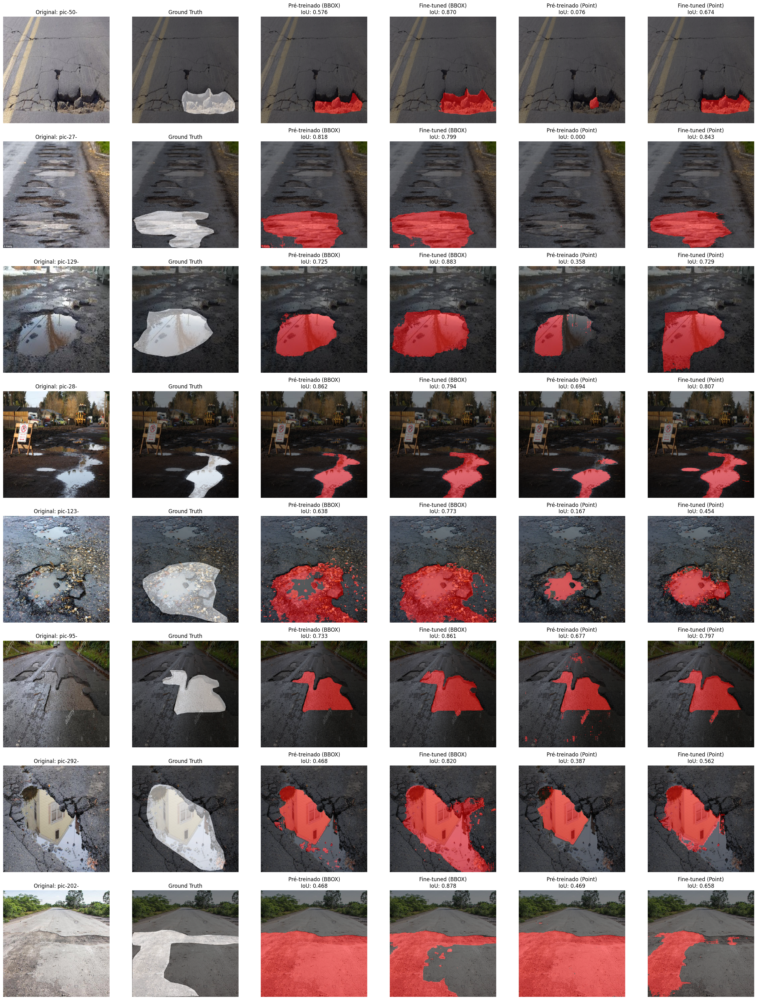

In [69]:
import random

def plot_mask_overlay(ax, image, mask, title, color='red', alpha=0.5):
    ax.imshow(image)
    if mask.any():
        overlay_mask = np.zeros_like(image, dtype=np.uint8)
        if color == 'red': # Predições
            overlay_mask[mask == 1] = [255, 0, 0] # Vermelho
        elif color == 'white': # Ground Truth
            overlay_mask[mask == 1] = [255, 255, 255] # Branco
        elif color == 'green': # Para outros casos, se necessário
            overlay_mask[mask == 1] = [0, 255, 0]

        blended_image = cv2.addWeighted(image, 1 - alpha, overlay_mask, alpha, 0)
        ax.imshow(blended_image)
    ax.set_title(title)
    ax.axis('off')

def visualize_detailed_comparison(num_samples=5):
    print(f"🖼️ Gerando visualização comparativa para {num_samples} amostras...")
    # Seleciona índices aleatórios do conjunto de validação
    indices = random.sample(range(len(val_dataset)), num_samples)

    # Layout: num_samples linhas x 6 colunas (Original, GT, Pre-BBOX, FT-BBOX, Pre-Point, FT-Point)
    fig, axes = plt.subplots(num_samples, 6, figsize=(25, 4 * num_samples))

    # Garante que axes seja 2D mesmo para 1 amostra
    if num_samples == 1:
        axes = np.expand_dims(axes, axis=0)

    for row_idx, idx in enumerate(indices):
        sample = val_dataset[idx]
        image = sample['image']
        gt_mask = sample['mask']

        # Garante que a máscara GT seja booleana para comparação consistente
        gt_mask_bool = gt_mask > 0

        # --- Coluna 0: Imagem Original ---
        axes[row_idx, 0].imshow(image)
        axes[row_idx, 0].set_title(f"Original: {sample['filename'].split('_')[0]}")
        axes[row_idx, 0].axis('off')

        # --- Coluna 1: Ground Truth (overlay branco) ---
        plot_mask_overlay(axes[row_idx, 1], image, gt_mask_bool, "Ground Truth", color='white')

        # Preparar predictors
        predictor_pretrained = SamPredictor(sam_pretrained)
        predictor_pretrained.set_image(image)
        predictor_finetuned = SamPredictor(sam_finetuned)
        predictor_finetuned.set_image(image)

        # --- BBOX Prompts ---
        bbox = get_bbox_from_mask(gt_mask_bool)

        # Pre-trained BBOX (Coluna 2)
        if bbox is not None:
            masks_pre_bbox, _, _ = predictor_pretrained.predict(box=bbox, multimask_output=False)
            pred_mask_pre_bbox = masks_pre_bbox[0]
            iou_pre_bbox = calculate_metrics(pred_mask_pre_bbox, gt_mask_bool)['iou']
        else:
            pred_mask_pre_bbox = np.zeros_like(gt_mask_bool)
            iou_pre_bbox = 0.0
        plot_mask_overlay(axes[row_idx, 2], image, pred_mask_pre_bbox, f"Pré-treinado (BBOX)\nIoU: {iou_pre_bbox:.3f}", color='red')

        # Fine-tuned BBOX (Coluna 3)
        if bbox is not None:
            masks_ft_bbox, _, _ = predictor_finetuned.predict(box=bbox, multimask_output=False)
            pred_mask_ft_bbox = masks_ft_bbox[0]
            iou_ft_bbox = calculate_metrics(pred_mask_ft_bbox, gt_mask_bool)['iou']
        else:
            pred_mask_ft_bbox = np.zeros_like(gt_mask_bool)
            iou_ft_bbox = 0.0
        plot_mask_overlay(axes[row_idx, 3], image, pred_mask_ft_bbox, f"Fine-tuned (BBOX)\nIoU: {iou_ft_bbox:.3f}", color='red')

        # --- Point Prompts ---
        point = get_center_point_from_mask(gt_mask_bool)

        # Pre-trained Point (Coluna 4)
        if point is not None:
            masks_pre_point, _, _ = predictor_pretrained.predict(point_coords=point, point_labels=np.array([1]), multimask_output=False)
            pred_mask_pre_point = masks_pre_point[0]
            iou_pre_point = calculate_metrics(pred_mask_pre_point, gt_mask_bool)['iou']
        else:
            pred_mask_pre_point = np.zeros_like(gt_mask_bool)
            iou_pre_point = 0.0
        plot_mask_overlay(axes[row_idx, 4], image, pred_mask_pre_point, f"Pré-treinado (Point)\nIoU: {iou_pre_point:.3f}", color='red')

        # Fine-tuned Point (Coluna 5)
        if point is not None:
            masks_ft_point, _, _ = predictor_finetuned.predict(point_coords=point, point_labels=np.array([1]), multimask_output=False)
            pred_mask_ft_point = masks_ft_point[0]
            iou_ft_point = calculate_metrics(pred_mask_ft_point, gt_mask_bool)['iou']
        else:
            pred_mask_ft_point = np.zeros_like(gt_mask_bool)
            iou_ft_point = 0.0
        plot_mask_overlay(axes[row_idx, 5], image, pred_mask_ft_point, f"Fine-tuned (Point)\nIoU: {iou_ft_point:.3f}", color='red')

    plt.tight_layout()
    plt.show()

visualize_detailed_comparison(num_samples=8)


## 12. Segmentação de Vídeo com SAM Fine-tuned

Abaixo, implementamos uma função para processar vídeos. Utilizamos a estratégia **Grounded-SAM**:
1. **GroundingDINO** detecta os buracos e fornece as Bounding Boxes.
2. **SAM Fine-tuned** recebe as boxes e gera as máscaras de segmentação de alta precisão.

In [57]:
def process_video_with_model(input_path, output_path, sam_model, gdino_model=None, text_prompt="pothole"):
    cap = cv2.VideoCapture(input_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Codec para MP4
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    predictor = SamPredictor(sam_model)

    print(f"🎥 Processando vídeo: {input_path}...")
    print(f"ℹ️ Dimensões: {width}x{height} | FPS: {fps}")

    frame_count = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Converter para RGB para o modelo
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        masks_found = []

        if gdino_model:
            # 1. Detectar caixas com GroundingDINO
            detections = gdino_model.predict_with_classes(
                image=frame_rgb,
                classes=[text_prompt],
                box_threshold=0.30,
                text_threshold=0.25
            )

            if len(detections.xyxy) > 0:
                # 2. Segmentar com SAM Fine-tuned usando as caixas
                predictor.set_image(frame_rgb)

                # Transformar caixas para tensores torch
                transformed_boxes = predictor.transform.apply_boxes_torch(
                    torch.as_tensor(detections.xyxy, device=device),
                    frame_rgb.shape[:2]
                )

                masks, _, _ = predictor.predict_torch(
                    point_coords=None,
                    point_labels=None,
                    boxes=transformed_boxes,
                    multimask_output=False
                )

                # Converter máscaras para numpy
                masks_found = masks.cpu().numpy().squeeze(1)

        # Desenhar no frame (Overlay)
        overlay = frame.copy()

        # Combinar todas as máscaras encontradas
        combined_mask = np.zeros((height, width), dtype=bool)
        if len(masks_found) > 0:
            for m in masks_found:
                combined_mask = np.logical_or(combined_mask, m > 0)

        # Aplicar cor vermelha onde há máscara
        if combined_mask.any():
            # Pintar de vermelho (BGR: 0, 0, 255)
            overlay[combined_mask] = [0, 0, 255]

            # Misturar com transparência (alpha blending)
            alpha = 0.5
            frame = cv2.addWeighted(overlay, alpha, frame, 1 - alpha, 0)

            # Desenhar contornos para destacar
            contours, _ = cv2.findContours(combined_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cv2.drawContours(frame, contours, -1, (0, 0, 255), 2)

        out.write(frame)
        frame_count += 1

        if frame_count % 10 == 0:
            print(f"\rProcessados {frame_count} frames...", end="")

    cap.release()
    out.release()
    print(f"\n✅ Vídeo salvo em: {output_path}")

# Exemplo de uso (descomente e ajuste o caminho se tiver um vídeo)
process_video_with_model(
    input_path="sample_video.mp4",
    output_path="video_segmentado.mp4",
    sam_model=sam_finetuned,
    gdino_model=grounding_dino_model,
    text_prompt="pothole"
)

🎥 Processando vídeo: sample_video.mp4...
ℹ️ Dimensões: 1280x720 | FPS: 25
⚡ Detecção (DINO) a cada 5 frames | Thresh: Box=0.25, Text=0.25
Processados 370 frames...
✅ Vídeo salvo em: video_segmentado_otimizado.mp4
